In [1]:
library(rhdf5)
suppressMessages(library(dplyr))
library(broom)
suppressMessages(library(MASS))
library(ggplot2)

# Load h5 file

In [2]:
h5.path <- "/iblm/netapp/data1/jezhou/crisprQTL/simulated_data_interactions_2guides_power_analysis_12-12-2022/sim.h5"

In [3]:
h5ls(h5.path)

,group,name,otype,dclass,dim
,<chr>,<chr>,<chr>,<chr>,<chr>
0,/,coeffs,H5I_DATASET,COMPOUND,13000
1,/,counts,H5I_GROUP,,
2,/counts,lambda100_size0.5,H5I_DATASET,INTEGER,13000 x 50000
3,/counts,lambda100_size1,H5I_DATASET,INTEGER,13000 x 50000
4,/counts,lambda100_size3,H5I_DATASET,INTEGER,13000 x 50000
5,/counts,lambda100_size5,H5I_DATASET,INTEGER,13000 x 50000
6,/counts,lambda100_size7,H5I_DATASET,INTEGER,13000 x 50000
7,/counts,lambda15_size0.5,H5I_DATASET,INTEGER,13000 x 50000
8,/counts,lambda15_size1,H5I_DATASET,INTEGER,13000 x 50000


# Load important info

In [4]:
all.ts.pairs <- h5read(h5.path, "pairs")
lambda.list <- h5read(h5.path, "lambda")
effect.sizes.list <- h5read(h5.path, "effect.sizes")
guide.target.map <- h5read(h5.path, "guides/guide_target_map")
coeffs <- h5read(h5.path, "coeffs")
cell.cycle.scores <- h5read(h5.path, "x/cell_cycle_scores")
percent.mito <- h5read(h5.path, "x/percent_mito")
scaling.factors <- h5read(h5.path, "scaling_factors")

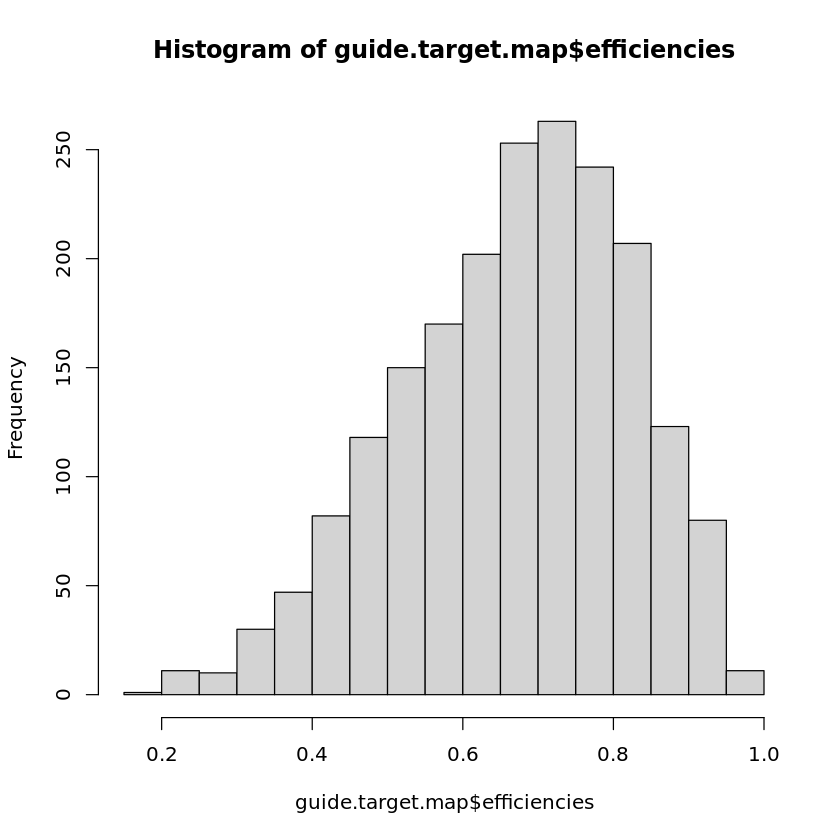

In [5]:
hist(guide.target.map$efficiencies)

In [6]:
lambda.list

[1]  15  25  50  75 100

In [7]:
effect.sizes.list

[1] 0.5 1.0 3.0 5.0 7.0

# Identify positive/negative target genes

In [8]:
pos.genes.to.test <- all.ts.pairs %>% filter(set=='positive') %>% pull(target.genes)
neg.genes.to.test <- all.ts.pairs %>% filter(set == "negative") %>% pull(target.genes)

# Check if linear predictors differ as expected between different values of lambda and effect size 

Test: $\lambda=50$


In [9]:
lambda.test <- 50

In [10]:
lp.mtx.list <- list()
i <- 1

for (size in effect.sizes.list) {
    print(size)
    set.name <- paste0("lambda",lambda.test, "_size", size)
    lp.mtx <- h5read(h5.path, paste0("linear_predictor/", set.name))
    lp.mtx.list[[i]] <- lp.mtx
    i <- i + 1
}

[1] 0.5
[1] 1
[1] 3
[1] 5
[1] 7


In [81]:
lp.size05.pos.genes <- lp.mtx.list[[1]][pos.genes.to.test,]

In [70]:
lp.size1.pos.genes <- lp.mtx.list[[2]][pos.genes.to.test,]

In [56]:
lp.size3.pos.genes <- lp.mtx.list[[3]][pos.genes.to.test,]

In [57]:
lp.size5.pos.genes <- lp.mtx.list[[4]][pos.genes.to.test,]

In [114]:
diff.7.vs.5 <- lp.mtx.list[[5]][pos.genes.to.test,] - lp.mtx.list[[4]][pos.genes.to.test,]

In [120]:
which(xab.lambda50[pos.genes.to.test[1],] != 0)

[1]   641   760   878  2153  2373  2903  3107  3232  4189  4308  5422  5478
 [13]  5939  6686  6759  8167  8910  9679 10066 10287 10495 10993 11310 11367
 [25] 12425 12550 13148 13452 13517 15391 16373 16739 16997 17142 17554 17975
 [37] 18459 18631 18695 18919 19595 19676 20076 20425 20890 21463 21734 22961
 [49] 22980 23459 24457 24702 24831 25022 25214 25725 25974 26534 26782 27058
 [61] 27683 27688 27767 27773 29047 30403 31270 31341 31442 31819 32151 32544
 [73] 33138 33195 35723 35757 35910 36805 37348 37453 37952 37990 38257 38971
 [85] 38979 39888 40001 40838 41482 42876 43245 43423 44284 46000 46527 46956
 [97] 47176 47266 47490 48128 48531 48633 49285 49300 49792

In [116]:
head(diff.7.vs.5)

0.000000,0,0.000000,0,0.000000,0.000000,0.0000000,-4.290759,-3.8686845,0.000000,⋯,0.000000,0.000000,-5.9040717,-5.904072,0.000000,0.00000,0,0.000000,2.2075270,0
0.000000,0,0.000000,0,-1.019421,0.000000,0.0000000,0.000000,0.2929138,0.000000,⋯,1.019421,0.000000,0.0000000,-1.019421,-2.096264,0.00000,0,-1.019421,0.0000000,0
0.000000,0,2.815951,0,0.000000,1.095220,0.0000000,-1.247980,0.0000000,-1.095220,⋯,0.000000,0.000000,0.0000000,0.000000,0.000000,1.09522,0,0.000000,2.3432002,0
-1.671358,0,0.000000,0,0.000000,1.671358,0.0000000,0.000000,0.0000000,0.000000,⋯,0.000000,0.000000,-0.1197635,0.000000,0.000000,0.00000,0,0.000000,-1.7235971,0
-3.321389,0,0.000000,0,0.000000,0.000000,-0.5789056,0.000000,0.0000000,0.000000,⋯,0.000000,0.000000,0.5789056,0.000000,0.000000,0.00000,0,0.000000,0.0000000,0
-1.463728,0,0.000000,0,0.000000,2.940606,0.0000000,0.000000,-1.4441852,1.444185,⋯,0.000000,-2.940606,0.0000000,0.000000,2.940606,0.00000,0,0.000000,-0.3535568,0


In [122]:
which(diff.7.vs.5[1,]!=0)

[1]     8     9    14    18    25    27    29    30    33    37    43    47
   [13]    55    57    62    63    66    72    75    76    78    79    81    82
   [25]    85    89    90    95   100   101   103   106   107   109   115   117
   [37]   120   122   126   129   132   135   137   142   143   145   148   150
   [49]   153   159   163   164   165   169   170   173   174   177   180   182
   [61]   184   187   190   193   195   197   199   201   203   211   214   223
   [73]   224   225   233   235   240   241   243   245   246   248   249   256
   [85]   257   258   262   263   264   265   266   278   280   284   292   295
   [97]   297   303   310   314   319   322   323   324   330   331   332   336
  [109]   339   344   348   351   352   356   360   361   365   367   370   374
  [121]   376   377   379   381   386   390   394   398   401   403   404   422
  [133]   426   428   429   430   435   438   439   443   444   445   450   451
  [145]   455   458   466   471   473   475   480   485   488   495   497   498
  [157]   499   503   504   506   508   516   520   521   525   529   536   540
  [169]   541   547   549   551   552   553   554   555   557   559   560   564
  [181]   575   577   582   584   588   593   594   596   600   603   604   605
  [193]   607   608   611   613   617   620   623   624   626   627   629   640
  [205]   641   643   644   645   647   648   654   657   663   668   673   676
  [217]   682   685   686   691   705   711   715   721   726   729   744   745
  [229]   747   749   751   753   754   755   762   763   767   768   774   775
  [241]   778   784   791   792   795   797   798   799   800   804   805   806
  [253]   813   819   824   834   838   847   849   850   851   855   857   858
  [265]   861   869   875   876   877   887   892   896   899   900   904   910
  [277]   911   914   916   924   926   927   928   929   930   933   943   944
  [289]   947   948   967   968   970   975   984   991   992   994   995   998
  [301]   999  1002  1003  1006  1008  1011  1013  1019  1020  1021  1031  1037
  [313]  1041  1047  1050  1054  1058  1063  1067  1069  1072  1079  1081  1084
  [325]  1085  1089  1094  1095  1097  1100  1101  1103  1104  1105  1111  1122
  [337]  1123  1127  1128  1129  1130  1131  1132  1133  1136  1137  1138  1139
  [349]  1140  1141  1151  1153  1155  1167  1171  1177  1178  1180  1182  1183
  [361]  1186  1189  1195  1197  1198  1200  1204  1209  1211  1212  1214  1215
  [373]  1217  1226  1231  1233  1236  1237  1243  1244  1245  1246  1260  1262
  [385]  1263  1265  1266  1267  1283  1285  1288  1293  1297  1298  1299  1300
  [397]  1303  1309  1310  1313  1315  1316  1320  1324  1325  1326  1332  1333
  [409]  1335  1336  1337  1341  1344  1345  1350  1355  1362  1363  1364  1367
  [421]  1371  1372  1373  1374  1378  1382  1384  1385  1386  1390  1391  1397
  [433]  1399  1400  1403  1404  1412  1413  1414  1415  1418  1419  1421  1424
  [445]  1427  1431  1432  1434  1437  1443  1444  1447  1449  1454  1457  1458
  [457]  1461  1474  1478  1480  1481  1485  1487  1490  1493  1494  1498  1503
  [469]  1504  1507  1508  1510  1513  1514  1518  1519  1520  1521  1522  1528
  [481]  1538  1544  1549  1552  1554  1555  1556  1561  1567  1569  1570  1578
  [493]  1582  1583  1585  1593  1597  1601  1603  1608  1609  1613  1616  1617
  [505]  1623  1635  1641  1642  1644  1649  1653  1654  1658  1665  1674  1677
  [517]  1681  1684  1688  1696  1700  1702  1707  1708  1712  1716  1721  1725
  [529]  1729  1730  1731  1741  1748  1752  1753  1755  1759  1771  1774  1776
  [541]  1778  1779  1780  1784  1785  1789  1790  1793  1794  1797  1804  1812
  [553]  1816  1817  1820  1823  1826  1828  1836  1840  1843  1845  1848  1849
  [565]  1857  1860  1865  1869  1870  1876  1884  1886  1887  1888  1890  1895
  [577]  1900  1901  1902  1903  1904  1907  1908  1909  1910  1916  1918  1922
  [589]  1930  1935  1936  1940  1941  1946  1952  1955  1957  1958  1959  1963
  [6

In [112]:
head(lp.mtx.list[[5]][pos.genes.to.test,])

0.3561474,2.5857213,-1.4756841,-2.4253959,-0.5709186,0.5333952,-0.4810680,-5.1976444,-6.6490186,-0.8504304,⋯,-0.9141287,0.02537721,-5.1188229,-7.1114537,-0.2748843,-1.0773120,1.02060790,-0.9901128,-2.2883759,-1.0463719
4.7738110,7.0356929,4.6250304,2.4034278,2.0483761,3.8688046,2.8825122,0.2921484,3.1345179,3.1354257,⋯,2.9267739,4.04627687,4.0760578,1.5146418,1.9454959,2.6811617,4.67321496,1.4655456,3.9167205,3.4110928
1.9387120,3.3696721,1.7555480,0.4935136,0.6234931,1.0397094,0.4254088,-2.2665319,0.7235457,-0.3407775,⋯,0.5876858,1.33988088,1.1746195,0.3037974,1.4046375,0.3935439,1.65704234,0.2188121,1.3272542,1.0438545
-1.8014665,0.9488745,-0.1194396,-1.4897946,-0.8595276,-0.4249996,-0.9113533,-1.1756017,-0.8923101,-0.9073687,⋯,-0.9711179,-0.47116545,-1.9578797,-1.1607013,-0.5580183,-1.1099534,-0.05012869,-1.0939380,-2.1892513,-0.8952272
-2.9119723,2.8279269,0.5735964,-2.5007156,-0.6930858,0.4594607,-1.2104814,-1.0915969,-0.8401626,-0.9405434,⋯,-1.0333096,0.01131623,0.7182045,-1.3599426,-0.2622444,-1.2117740,1.02057174,-1.1749705,-0.2475692,-1.0740889
-3.5367704,-0.5146535,-2.2731105,-3.6864057,-3.5337559,-3.0863652,-3.7607425,-4.1533995,-4.8733054,-3.3901078,⋯,-3.5712537,-5.69168523,-2.9353944,-3.8878018,-2.6846894,-3.7959043,-2.39635792,-3.9724618,-5.1290917,-3.0793836


In [59]:
head(lp.size5.pos.genes)

0.3561474,2.5857213,-1.4756841,-2.4253959,-0.5709186,0.53339519,-0.4810680,-0.9068852,-2.7803341,-0.8504304,⋯,-0.9141287,0.02537721,0.7852488,-1.2073819,-0.2748843,-1.0773120,1.02060790,-0.9901128,-4.4959029,-1.0463719
4.7738110,7.0356929,4.6250304,2.4034278,3.0677976,3.86880463,2.8825122,0.2921484,2.8416041,3.1354257,⋯,1.9073524,4.04627687,4.0760578,2.5340632,4.0417602,2.6811617,4.67321496,2.4849670,3.9167205,3.4110928
1.9387120,3.3696721,-1.0604030,0.4935136,0.6234931,-0.05551038,0.4254088,-1.0185515,0.7235457,0.7544423,⋯,0.5876858,1.33988088,1.1746195,0.3037974,1.4046375,-0.7016759,1.65704234,0.2188121,-1.0159460,1.0438545
-0.1301086,0.9488745,-0.1194396,-1.4897946,-0.8595276,-2.09635751,-0.9113533,-1.1756017,-0.8923101,-0.9073687,⋯,-0.9711179,-0.47116545,-1.8381162,-1.1607013,-0.5580183,-1.1099534,-0.05012869,-1.0939380,-0.4656542,-0.8952272
0.4094167,2.8279269,0.5735964,-2.5007156,-0.6930858,0.45946072,-0.6315758,-1.0915969,-0.8401626,-0.9405434,⋯,-1.0333096,0.01131623,0.1392989,-1.3599426,-0.2622444,-1.2117740,1.02057174,-1.1749705,-0.2475692,-1.0740889
-2.0730424,-0.5146535,-2.2731105,-3.6864057,-3.5337559,-6.02697080,-3.7607425,-4.1533995,-3.4291202,-4.8342929,⋯,-3.5712537,-2.75107966,-2.9353944,-3.8878018,-5.6252949,-3.7959043,-2.39635792,-3.9724618,-4.7755349,-3.0793836


In [75]:
head(lp.size3.pos.genes)

0.3561474,2.5857213,0.5597032,-2.4253959,-0.5709186,0.5333952,-0.4810680,-0.90688519,-0.7449469,-0.8504304,⋯,-0.9141287,0.02537721,0.7852488,-1.2073819,-0.2748843,-1.0773120,1.02060790,-0.9901128,-0.2051436,-1.0463719
4.7738110,7.0356929,4.6250304,-1.3317529,3.0677976,3.8688046,2.8825122,2.38841270,3.1345179,3.1354257,⋯,2.9267739,4.04627687,4.0760578,2.5340632,4.0417602,2.6811617,4.67321496,2.4849670,3.9167205,3.4110928
1.9387120,3.3696721,0.6603282,0.4935136,-0.6651785,1.0397094,0.4254088,0.07666828,0.7235457,0.7544423,⋯,0.5876858,1.33988088,1.1746195,0.3037974,1.4046375,0.3935439,1.65704234,0.2188121,1.3272542,1.0438545
-0.1301086,0.9488745,-0.1194396,-1.4897946,-2.5308855,-0.4249996,-0.9113533,-2.43264964,-0.8923101,-0.9073687,⋯,-0.9711179,-0.47116545,-0.2865218,-2.8842984,-0.5580183,-1.1099534,-0.05012869,-2.7652960,-0.4656542,-0.8952272
0.4094167,2.2490213,0.5735964,-2.5007156,-0.6930858,0.4594607,-0.6315758,-3.39695852,-0.8401626,-0.9405434,⋯,-3.3386712,0.01131623,0.7182045,-1.3599426,-0.2622444,-1.2117740,1.02057174,-1.1749705,-1.0496178,-1.0740889
-2.0730424,-0.5146535,-2.2731105,-3.6864057,-3.5337559,-5.1258222,-3.7607425,-4.15339949,-3.4291202,-3.3901078,⋯,-3.5712537,-2.75107966,-2.9353944,-3.8878018,-2.6846894,-3.7959043,-2.39635792,-3.9724618,-2.7360779,-3.0793836


In [74]:
head(lp.size1.pos.genes)

0.3561474,2.5857213,0.5597032,-2.4253959,-0.5709186,0.5333952,-0.4810680,-0.90688519,-0.7449469,-0.8504304,⋯,-0.9141287,0.02537721,0.7852488,-1.2073819,-0.2748843,-1.0773120,1.02060790,-0.9901128,-0.2051436,-1.0463719
4.7738110,7.0356929,4.6250304,-1.3317529,3.0677976,3.8688046,2.8825122,2.38841270,3.1345179,3.1354257,⋯,2.9267739,4.04627687,4.0760578,2.5340632,4.0417602,2.6811617,4.67321496,2.4849670,3.9167205,3.4110928
1.9387120,3.3696721,0.6603282,0.4935136,-0.6651785,1.0397094,0.4254088,0.07666828,0.7235457,0.7544423,⋯,0.5876858,1.33988088,1.1746195,0.3037974,1.4046375,0.3935439,1.65704234,0.2188121,1.3272542,1.0438545
-0.1301086,0.9488745,-0.1194396,-1.4897946,-2.5308855,-0.4249996,-0.9113533,-2.43264964,-0.8923101,-0.9073687,⋯,-0.9711179,-0.47116545,-0.2865218,-2.8842984,-0.5580183,-1.1099534,-0.05012869,-2.7652960,-0.4656542,-0.8952272
0.4094167,2.2490213,0.5735964,-2.5007156,-0.6930858,0.4594607,-0.6315758,-3.39695852,-0.8401626,-0.9405434,⋯,-3.3386712,0.01131623,0.7182045,-1.3599426,-0.2622444,-1.2117740,1.02057174,-1.1749705,-1.0496178,-1.0740889
-2.0730424,-0.5146535,-2.2731105,-3.6864057,-3.5337559,-5.1258222,-3.7607425,-4.15339949,-3.4291202,-3.3901078,⋯,-3.5712537,-2.75107966,-2.9353944,-3.8878018,-2.6846894,-3.7959043,-2.39635792,-3.9724618,-2.7360779,-3.0793836


In [82]:
head(lp.size05.pos.genes)

0.3561474,2.5857213,0.5597032,-2.4253959,-0.5709186,0.5333952,-0.4810680,-0.90688519,-0.7449469,-0.8504304,⋯,-0.9141287,0.02537721,0.7852488,-1.2073819,-0.2748843,-1.0773120,1.02060790,-0.9901128,-0.2051436,-1.0463719
4.7738110,7.0356929,4.6250304,-1.3317529,3.0677976,3.8688046,2.8825122,2.38841270,3.1345179,3.1354257,⋯,2.9267739,4.04627687,4.0760578,2.5340632,4.0417602,2.6811617,4.67321496,2.4849670,3.9167205,3.4110928
1.9387120,3.3696721,0.6603282,0.4935136,-0.6651785,1.0397094,0.4254088,0.07666828,0.7235457,0.7544423,⋯,0.5876858,1.33988088,1.1746195,0.3037974,1.4046375,0.3935439,1.65704234,0.2188121,1.3272542,1.0438545
-0.1301086,0.9488745,-0.1194396,-1.4897946,-2.5308855,-0.4249996,-0.9113533,-2.43264964,-0.8923101,-0.9073687,⋯,-0.9711179,-0.47116545,-0.2865218,-2.8842984,-0.5580183,-1.1099534,-0.05012869,-2.7652960,-0.4656542,-0.8952272
0.4094167,2.2490213,0.5735964,-2.5007156,-0.6930858,0.4594607,-0.6315758,-3.39695852,-0.8401626,-0.9405434,⋯,-3.3386712,0.01131623,0.7182045,-1.3599426,-0.2622444,-1.2117740,1.02057174,-1.1749705,-1.0496178,-1.0740889
-2.0730424,-0.5146535,-2.2731105,-3.6864057,-3.5337559,-5.1258222,-3.7607425,-4.15339949,-3.4291202,-3.3901078,⋯,-3.5712537,-2.75107966,-2.9353944,-3.8878018,-2.6846894,-3.7959043,-2.39635792,-3.9724618,-2.7360779,-3.0793836


In [61]:
head(lp.size5.pos.genes - lp.size3.pos.genes)

0,0.0000000,-2.035387,0.000000,0.000000,0.0000000,0,0.000000,-2.0353873,0.000000,⋯,0.000000,0,0.0000000,0.000000,0.000000,0.00000,0,0.000000,-4.2907592,0
0,0.0000000,0.000000,3.735181,0.000000,0.0000000,0,-2.096264,-0.2929138,0.000000,⋯,-1.019421,0,0.0000000,0.000000,0.000000,0.00000,0,0.000000,0.0000000,0
0,0.0000000,-1.720731,0.000000,1.288672,-1.0952198,0,-1.095220,0.0000000,0.000000,⋯,0.000000,0,0.0000000,0.000000,0.000000,-1.09522,0,0.000000,-2.3432002,0
0,0.0000000,0.000000,0.000000,1.671358,-1.6713579,0,1.257048,0.0000000,0.000000,⋯,0.000000,0,-1.5515944,1.723597,0.000000,0.00000,0,1.671358,0.0000000,0
0,0.5789056,0.000000,0.000000,0.000000,0.0000000,0,2.305362,0.0000000,0.000000,⋯,2.305362,0,-0.5789056,0.000000,0.000000,0.00000,0,0.000000,0.8020486,0
0,0.0000000,0.000000,0.000000,0.000000,-0.9011486,0,0.000000,0.0000000,-1.444185,⋯,0.000000,0,0.0000000,0.000000,-2.940606,0.00000,0,0.000000,-2.0394570,0


In [79]:
which(head(lp.size3.pos.genes - lp.size1.pos.genes)[1,] != 0)

[1]   641   760   878  2153  2373  2903  3107  3232  4189  4308  5422  5478
 [13]  5939  6686  6759  8167  8910  9679 10066 10287 10495 10993 11310 11367
 [25] 12425 12550 13148 13452 13517 15391 16373 16739 16997 17142 17554 17975
 [37] 18459 18631 18695 18919 19595 19676 20076 20425 20890 21463 21734 22961
 [49] 22980 23459 24457 24702 24831 25022 25214 25725 25974 26534 26782 27058
 [61] 27683 27688 27767 27773 29047 30403 31270 31341 31442 31819 32151 32544
 [73] 33138 33195 35723 35757 35910 36805 37348 37453 37952 37990 38257 38971
 [85] 38979 39888 40001 40838 41482 42876 43245 43423 44284 46000 46527 46956
 [97] 47176 47266 47490 48128 48531 48633 49285 49300 49792

### Compare $\beta_{AB}=3$ to $\beta_{AB}=1$

Power analysis shows expected behavior at these values

In [84]:
diff.3.vs.1 <- lp.size3.pos.genes - lp.size1.pos.genes

In [62]:
# Load values of XAB for lambda=50

xab.lambda50 <- h5read(h5.path, "x/x_ab/50")

In [76]:
which(xab.lambda50[pos.genes.to.test[1],] != 0)

[1]   641   760   878  2153  2373  2903  3107  3232  4189  4308  5422  5478
 [13]  5939  6686  6759  8167  8910  9679 10066 10287 10495 10993 11310 11367
 [25] 12425 12550 13148 13452 13517 15391 16373 16739 16997 17142 17554 17975
 [37] 18459 18631 18695 18919 19595 19676 20076 20425 20890 21463 21734 22961
 [49] 22980 23459 24457 24702 24831 25022 25214 25725 25974 26534 26782 27058
 [61] 27683 27688 27767 27773 29047 30403 31270 31341 31442 31819 32151 32544
 [73] 33138 33195 35723 35757 35910 36805 37348 37453 37952 37990 38257 38971
 [85] 38979 39888 40001 40838 41482 42876 43245 43423 44284 46000 46527 46956
 [97] 47176 47266 47490 48128 48531 48633 49285 49300 49792

In [97]:
diff.3.vs.1[1,which(diff.3.vs.1[1,]!=0)]

[1] 1.3342051 1.3655677 1.3655677 1.3655677 0.9924205 1.3342051 1.3342051
  [8] 1.3655677 1.3342051 0.9696279 0.9924205 1.3655677 0.9696279 1.3342051
 [15] 0.9924205 1.3342051 0.9924205 0.9924205 0.9924205 1.3655677 0.9696279
 [22] 1.3655677 0.9696279 0.9696279 0.9696279 0.9696279 1.3342051 1.3655677
 [29] 1.3655677 1.3655677 0.9696279 0.9924205 1.3655677 1.5054592 0.9696279
 [36] 0.9696279 1.1579908 0.9924205 0.9924205 1.3655677 1.3655677 1.3342051
 [43] 1.3342051 1.3655677 1.3342051 0.9924205 1.3342051 0.9924205 0.9696279
 [50] 0.9696279 1.3655677 1.3655677 0.9696279 1.3655677 1.3342051 1.3655677
 [57] 1.3342051 1.3655677 1.3655677 1.3655677 1.3655677 0.9696279 1.3342051
 [64] 1.3655677 0.9924205 0.9696279 1.3342051 1.3655677 1.3342051 0.9924205
 [71] 0.9924205 0.9924205 0.9924205 0.9924205 0.9696279 0.9924205 0.9924205
 [78] 0.9696279 1.3655677 1.3655677 1.3655677 1.3655677 0.9696279 0.9696279
 [85] 0.9696279 1.3655677 1.3342051 0.9924205 0.9924205 1.3342051 0.9696279
 [92] 1.3342051 1.3655677 1.3342051 1.3655677 0.9696279 0.9696279 0.9696279
 [99] 0.9696279 1.3655677 0.9696279 1.3655677 0.9696279 0.9924205 1.3342051

In [106]:
all(round(2*xab.lambda50[pos.genes.to.test[1],], 3) == round(diff.3.vs.1[1,],3))

[1] TRUE

### Compare $\beta_{AB}=5$ to $\beta_{AB}=3$

Power analysis shows deviant behavior at $\beta_{AB}=5$

In [108]:
diff.5.vs.3 <- lp.size5.pos.genes - lp.size3.pos.genes

In [109]:
head(diff.5.vs.3)

0,0.0000000,-2.035387,0.000000,0.000000,0.0000000,0,0.000000,-2.0353873,0.000000,⋯,0.000000,0,0.0000000,0.000000,0.000000,0.00000,0,0.000000,-4.2907592,0
0,0.0000000,0.000000,3.735181,0.000000,0.0000000,0,-2.096264,-0.2929138,0.000000,⋯,-1.019421,0,0.0000000,0.000000,0.000000,0.00000,0,0.000000,0.0000000,0
0,0.0000000,-1.720731,0.000000,1.288672,-1.0952198,0,-1.095220,0.0000000,0.000000,⋯,0.000000,0,0.0000000,0.000000,0.000000,-1.09522,0,0.000000,-2.3432002,0
0,0.0000000,0.000000,0.000000,1.671358,-1.6713579,0,1.257048,0.0000000,0.000000,⋯,0.000000,0,-1.5515944,1.723597,0.000000,0.00000,0,1.671358,0.0000000,0
0,0.5789056,0.000000,0.000000,0.000000,0.0000000,0,2.305362,0.0000000,0.000000,⋯,2.305362,0,-0.5789056,0.000000,0.000000,0.00000,0,0.000000,0.8020486,0
0,0.0000000,0.000000,0.000000,0.000000,-0.9011486,0,0.000000,0.0000000,-1.444185,⋯,0.000000,0,0.0000000,0.000000,-2.940606,0.00000,0,0.000000,-2.0394570,0


In [110]:
which(diff.5.vs.3[1,]!=0)

[1]     3     9    14    18    20    27    28    29    33    37    41    43
   [13]    50    52    62    72    75    81    82    94   100   106   109   114
   [25]   120   122   123   126   129   138   145   148   150   153   156   159
   [37]   162   163   170   177   179   184   189   190   195   196   197   199
   [49]   203   206   211   214   226   234   235   240   243   246   248   258
   [61]   278   283   284   292   295   297   303   309   310   319   322   327
   [73]   331   332   339   356   359   365   367   370   374   377   379   381
   [85]   382   386   395   397   417   427   428   434   443   444   445   451
   [97]   454   458   466   471   473   475   479   488   497   498   503   506
  [109]   507   508   515   521   524   527   532   535   540   549   551   554
  [121]   555   557   559   577   580   585   594   600   601   603   605   607
  [133]   608   611   613   619   621   627   629   641   648   649   653   654
  [145]   657   658   663   666   668   673   685   711   715   721   726   736
  [157]   738   739   749   751   754   760   762   770   775   778   784   792
  [169]   797   799   806   813   814   816   818   819   824   834   849   850
  [181]   851   855   861   869   877   878   899   910   913   916   923   924
  [193]   926   927   928   937   943   944   948   956   963   966   970   972
  [205]   975   976   984   986   991   994   995   998  1002  1004  1011  1013
  [217]  1016  1020  1021  1036  1037  1040  1041  1047  1050  1058  1059  1062
  [229]  1063  1069  1070  1072  1079  1080  1081  1082  1084  1085  1087  1089
  [241]  1094  1095  1100  1102  1104  1105  1113  1119  1123  1127  1129  1130
  [253]  1132  1133  1138  1139  1140  1141  1149  1151  1153  1159  1162  1167
  [265]  1172  1178  1179  1182  1183  1188  1197  1224  1236  1244  1248  1251
  [277]  1255  1258  1260  1262  1276  1288  1293  1299  1300  1303  1307  1310
  [289]  1315  1316  1319  1322  1324  1332  1333  1335  1336  1337  1345  1348
  [301]  1350  1355  1362  1363  1366  1371  1372  1373  1374  1378  1384  1386
  [313]  1388  1390  1395  1399  1404  1413  1415  1418  1419  1426  1427  1444
  [325]  1447  1449  1457  1461  1474  1475  1476  1478  1481  1485  1486  1490
  [337]  1491  1494  1498  1503  1508  1509  1510  1522  1536  1544  1552  1554
  [349]  1556  1569  1578  1587  1593  1597  1602  1608  1613  1617  1623  1636
  [361]  1639  1648  1654  1658  1660  1665  1666  1671  1673  1676  1677  1688
  [373]  1696  1700  1702  1707  1709  1712  1716  1721  1729  1730  1731  1737
  [385]  1740  1741  1743  1750  1752  1753  1755  1760  1762  1773  1778  1784
  [397]  1785  1789  1793  1798  1799  1812  1813  1817  1820  1823  1836  1840
  [409]  1843  1849  1851  1856  1857  1860  1866  1870  1883  1895  1901  1907
  [421]  1909  1910  1918  1930  1935  1936  1937  1941  1945  1948  1958  1959
  [433]  1964  1970  1971  1973  1977  1980  1984  1990  1992  1994  2006  2007
  [445]  2012  2019  2031  2032  2038  2048  2049  2052  2055  2062  2064  2067
  [457]  2081  2082  2090  2092  2096  2098  2106  2107  2108  2109  2118  2119
  [469]  2126  2140  2146  2147  2148  2151  2153  2156  2157  2160  2163  2167
  [481]  2168  2169  2172  2174  2175  2176  2180  2181  2182  2183  2186  2190
  [493]  2192  2193  2194  2200  2202  2203  2206  2211  2216  2221  2224  2225
  [505]  2227  2231  2244  2250  2257  2268  2274  2282  2300  2304  2310  2313
  [517]  2318  2319  2322  2331  2335  2336  2345  2347  2350  2351  2353  2356
  [529]  2359  2360  2372  2373  2374  2376  2381  2386  2388  2391  2393  2400
  [541]  2403  2405  2420  2421  2423  2432  2433  2434  2444  2449  2457  2458
  [553]  2460  2463  2465  2474  2476  2485  2491  2497  2498  2502  2508  2516
  [565]  2520  2522  2525  2528  2529  2536  2551  2560  2564  2566  2573  2574
  [577]  2575  2582  2583  2592  2597  2605  2614  2617  2620  2625  2627  2628
  [589]  2629  2630  2634  2641  2647  2655  2661  2668  2670  2674  2675  2680
  [6

In [111]:
which(xab.lambda50[pos.genes.to.test[1],]!=0)

[1]   641   760   878  2153  2373  2903  3107  3232  4189  4308  5422  5478
 [13]  5939  6686  6759  8167  8910  9679 10066 10287 10495 10993 11310 11367
 [25] 12425 12550 13148 13452 13517 15391 16373 16739 16997 17142 17554 17975
 [37] 18459 18631 18695 18919 19595 19676 20076 20425 20890 21463 21734 22961
 [49] 22980 23459 24457 24702 24831 25022 25214 25725 25974 26534 26782 27058
 [61] 27683 27688 27767 27773 29047 30403 31270 31341 31442 31819 32151 32544
 [73] 33138 33195 35723 35757 35910 36805 37348 37453 37952 37990 38257 38971
 [85] 38979 39888 40001 40838 41482 42876 43245 43423 44284 46000 46527 46956
 [97] 47176 47266 47490 48128 48531 48633 49285 49300 49792

# Test fitting models to simulated data

In [10]:
pos.genes.to.test <- all.ts.pairs %>% filter(set=='positive') %>% pull(target.genes)
neg.genes.to.test <- all.ts.pairs %>% filter(set == "negative") %>% pull(target.genes)

In [11]:
head(pos.genes.to.test)

[1]  8005 11610 12825  8451 12096  6547

# Load counts, one hot encoding of gRNAs in cells, and $X_A,X_B, X_{AB}$

- simulated counts for each MOI/effect size
- $X_A, X_B, X_AB$ for each value of MOI

## TEST: $\lambda=50,\beta_{AB}=5$

In [12]:
lambda <- 50
size <- 5

In [13]:
one.hot.mtx <- h5read(h5.path, paste0("guides/one_hot/", lambda))

In [14]:
xa <- h5read(h5.path, paste0("x/x_a/", lambda))
xb <- h5read(h5.path, paste0("x/x_b/", lambda))
xab <- h5read(h5.path, paste0("x/x_ab/", lambda))

Test number of genes that pass min.cells filter

In [15]:
genes.passing <- 0
genes.passing.list <- c()
min.cells <- 20
i <- 1
for (tg in pos.genes.to.test) {
    print(paste("gene=", tg))
    if (sum(xab[tg,]!=0)>=min.cells) {
        genes.passing <- genes.passing + 1
        genes.passing.list[i] <- tg
        i <- i + 1
    }
}

[1] "gene= 8005"
[1] "gene= 11610"
[1] "gene= 12825"
[1] "gene= 8451"
[1] "gene= 12096"
[1] "gene= 6547"
[1] "gene= 8758"
[1] "gene= 7487"
[1] "gene= 5665"
[1] "gene= 10520"
[1] "gene= 1835"
[1] "gene= 5995"
[1] "gene= 1338"
[1] "gene= 2923"
[1] "gene= 11662"
[1] "gene= 334"
[1] "gene= 4964"
[1] "gene= 499"
[1] "gene= 12722"
[1] "gene= 5594"
[1] "gene= 4573"
[1] "gene= 5349"
[1] "gene= 6005"
[1] "gene= 5060"
[1] "gene= 5493"
[1] "gene= 4339"
[1] "gene= 10056"
[1] "gene= 1383"
[1] "gene= 3515"
[1] "gene= 6320"
[1] "gene= 10590"
[1] "gene= 11334"
[1] "gene= 11918"
[1] "gene= 11511"
[1] "gene= 11026"
[1] "gene= 9584"
[1] "gene= 12488"
[1] "gene= 5085"
[1] "gene= 4408"
[1] "gene= 2428"
[1] "gene= 4807"
[1] "gene= 12869"
[1] "gene= 3351"
[1] "gene= 8601"
[1] "gene= 4626"
[1] "gene= 5444"
[1] "gene= 6564"
[1] "gene= 4899"
[1] "gene= 12495"
[1] "gene= 11310"
[1] "gene= 3959"
[1] "gene= 10315"
[1] "gene= 10231"
[1] "gene= 5622"
[1] "gene= 6672"
[1] "gene= 8398"
[1] "gene= 5388"
[1] "gene= 1109

In [16]:
genes.passing

[1] 500

# Load list of simulated counts for fixed $\lambda$ and all effect sizes

$\lambda=50$

In [17]:
# list of simulated counts for this value of lambda and all effect sizes
sim.counts.list <- list()

for (j in 1:length(effect.sizes.list)) {
    set.name <- paste0("lambda", lambda, "_size", effect.sizes.list[j])
    counts <- h5read(h5.path, paste0("counts/", set.name))
    sim.counts.list[[j]] <- counts
}

In [18]:
size.ix <- which(effect.sizes.list==size)
size.ix

[1] 4

# Start by testing positive cases of interactions 

In [19]:
test.gene <- pos.genes.to.test[1]
print(paste('test gene:', test.gene))

[1] "test gene: 8005"


Get observed counts for gene

In [28]:
# obs.counts <- sim.counts.list[[size.ix]][test.gene,]
obs.counts <- sim.counts.list[[size.ix-1]][test.gene,]


Add pseudocount

In [29]:
obs.counts.adj <- obs.counts + 0.01

Retrieve $X_A,X_B,X_{AB}$ for gene

In [30]:
xa.gene <- xa[test.gene,]
xb.gene <- xb[test.gene,]
xab.gene <- xab[test.gene,]

In [31]:
gene.data <- data.frame(tsA = xa.gene, 
                       tsB = xb.gene,
                       tsAB = xab.gene,
                       s.score = cell.cycle.scores$s.scores,
                       g2m.score = cell.cycle.scores$g2m.scores,
                       percent.mito = percent.mito,
                       counts.adj = as.numeric(obs.counts.adj),
                        counts = obs.counts, 
                       scaling.factor = scaling.factors)

In [32]:
head(gene.data)

,tsA,tsB,tsAB,s.score,g2m.score,percent.mito,counts.adj,counts,scaling.factor
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,0,0,0,-0.032419921,0.29594647,0.061189311,1.01,1,0.050144
2,0,0,0,0.177359169,0.68404658,0.020062599,17.01,17,0.049985
3,0,0,0,0.030075442,0.20005580,0.070536331,2.01,2,0.050216
4,0,0,0,-0.315990697,0.02440705,0.005009365,0.01,0,0.050066
5,0,0,0,-0.002356869,-0.11512193,0.043356768,0.01,0,0.049830
6,0,0,0,0.145834298,-0.03337599,0.021487968,2.01,2,0.049538


Compare time it takes to fit model **with vs. without pseudocount**

In [33]:
system.time(alt <- glm.nb(counts ~ tsA * tsB + s.score + g2m.score + percent.mito + offset(log(scaling.factor)),
             data = gene.data))

   user  system elapsed 
 35.431  29.588   4.129 

In [225]:
system.time(alt.pseudo <- glm.nb(counts.adj ~ tsA * tsB + s.score + g2m.score + percent.mito + offset(log(scaling.factor)),
             data = gene.data))

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 9.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 18.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 7.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 18.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 21.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 15.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 15.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 31

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 9.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 7.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 9.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 10.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 23.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 9.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 10.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 45.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 15.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 16.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 9.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 9.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 14.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 9.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 9.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 10.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 12.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 7.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 9.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 17.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 21.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 14.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 27.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 7.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 8.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 11.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 6.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 7.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 7.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 12.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 12.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 24.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 19.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

   user  system elapsed 
158.948  49.077 117.785 

In [34]:
broom::tidy(alt)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),2.582315,1.404137e-02,183.90768791,0.000000e+00
tsA,-2.291202,6.668394e-02,-34.35912577,1.029103e-258
tsB,-7.243493,3.466854e-01,-20.89356483,6.127078e-97
s.score,6.582864,6.201983e-02,106.14126941,0.000000e+00
g2m.score,2.559652,3.077792e-02,83.16520808,0.000000e+00
percent.mito,3.863727,3.028618e-01,12.75739348,2.835304e-37
tsA:tsB,-25.780560,2.268706e+03,-0.01136355,9.909334e-01


In [27]:
coeffs %>% filter(gene == test.gene)

gene,betaA,betaB,beta0,beta.s,beta.g2m,percent.mito
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
8005,-2.512208,-7.170517,2.579678,6.619404,2.564607,3.676131


# Test a negative case of interaction

In [171]:
neg.test.gene <- neg.genes.to.test[1]
print(paste('test gene:', neg.test.gene))

[1] "test gene: 8341"


In [178]:
obs.counts <- sim.counts.list[[size.ix]][neg.test.gene,]
obs.counts.adj <- obs.counts + 0.01

xa.gene <- xa[neg.test.gene,]
xb.gene <- xb[neg.test.gene,]
xab.gene <- xab[neg.test.gene,]

In [179]:
gene.data <- data.frame(tsA = xa.gene, 
                       tsB = xb.gene,
                       tsAB = xab.gene,
                       s.score = cell.cycle.scores$s.scores,
                       g2m.score = cell.cycle.scores$g2m.scores,
                       percent.mito = percent.mito,
                       counts.adj = as.numeric(obs.counts.adj),
                        counts = obs.counts, 
                       scaling.factor = scaling.factors)

Compare time it takes to fit observations with vs. without pseudocount

In [180]:
alt <- glm.nb(counts ~ tsA * tsB + s.score + g2m.score + percent.mito + offset(log(scaling.factor)),
             data = gene.data)

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 7.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 5.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 18.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 4.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 3.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 2.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 1.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.010000”
Warning message in dpois(y, mu, log = TRUE):
“non-integer x = 0.

In [15]:
 broom::tidy(alt)

In [211]:
broom::tidy(alt) %>% filter(term=="tsA:tsB") %>% pull(p.value)

tsA:tsB 
0.06690408

In [199]:
tidy(alt) %>% dplyr::select(term, estimate)

term,estimate
<chr>,<dbl>
(Intercept),0.2165296
tsA,-1.0385498
tsB,-3.2956299
s.score,3.3011528
g2m.score,4.5091167
percent.mito,4.4899369
tsA:tsB,1.6407154


In [209]:
bind_cols(tidy(alt) %>% dplyr::select(term, estimate), 
							true = t(coeffs %>% filter(gene == neg.test.gene) %>%
                                    rename("tsA" = "betaA",
                                          "tsB" = "betaB",
                                          "(Intercept)" = "beta0",
                                          "s.score" = "beta.s",
                                          "g2m.score" = "beta.g2m") %>% 
                                          dplyr::select("(Intercept)",
                                                 "tsA",
                                                 "tsB",
                                                 "s.score",
                                                 "g2m.score",
                                                 "percent.mito") %>%
                                            mutate(`tsA:tsB`=size)), 
							gene = neg.test.gene)

term,estimate,true,gene
<chr>,<dbl>,"<dbl[,1]>",<int>
(Intercept),0.2165296,0.02310753,8341
tsA,-1.0385498,-1.13800699,8341
tsB,-3.2956299,-4.58110601,8341
s.score,3.3011528,3.56858215,8341
g2m.score,4.5091167,4.89958037,8341
percent.mito,4.4899369,4.54434684,8341
tsA:tsB,1.6407154,7.00000000,8341


In [208]:
t(coeffs %>% filter(gene == neg.test.gene) %>%
        rename("tsA" = "betaA",
              "tsB" = "betaB",
              "(Intercept)" = "beta0",
              "s.score" = "beta.s",
              "g2m.score" = "beta.g2m") %>% 
              dplyr::select("(Intercept)",
                     "tsA",
                     "tsB",
                     "s.score",
                     "g2m.score",
                     "percent.mito") %>% mutate(`tsA:tsB`=size))

(Intercept),0.02310753
tsA,-1.13800699
tsB,-4.58110601
s.score,3.56858215
g2m.score,4.89958037
percent.mito,4.54434684
tsA:tsB,7.00000000


In [182]:
coeffs %>% filter(gene == neg.test.gene)

gene,betaA,betaB,beta0,beta.s,beta.g2m,percent.mito
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
8341,-1.138007,-4.581106,0.02310753,3.568582,4.89958,4.544347


# Test all positive cases for all effect sizes

In [50]:
# pseudocount <- 0.01
pseudocount <- NULL

In [51]:
n.correct.list <- c()
coeffs.compare.list <- list()

for (j in 1:length(effect.sizes.list)) {
    print(paste('effect size =', effect.sizes.list[j]))

    n.correct <- 0

    coeffs.compare.list.sub <- list()
    k <- 1
    for (tg in pos.genes.to.test) {
        print(paste('gene', tg))
        obs.counts <- sim.counts.list[[j]][tg,]
        if (!is.null(pseudocount)) {
            obs.counts <- obs.counts + pseudocount
        }

        xa.gene <- xa[tg,]
        xb.gene <- xb[tg,]
        xab.gene <- xab[tg,]

        gene.data <- data.frame(tsA = xa.gene, 
                       tsB = xb.gene,
#                        tsAB = xab.gene,
                       s.score = cell.cycle.scores$s.scores,
                       g2m.score = cell.cycle.scores$g2m.scores,
                       percent.mito = percent.mito,
                        counts = obs.counts, 
                       scaling.factor = scaling.factors)

        alt <- glm.nb(counts ~ tsA * tsB + s.score + g2m.score + percent.mito + offset(log(scaling.factor)),
                      data = gene.data)

        alt.brm <- broom::tidy(alt)

        coeffs.compare.df <- bind_cols(alt.brm %>% dplyr::select(term, estimate), 
                                       true = t(coeffs %>% filter(gene == tg) %>%
                                                rename("tsA" = "betaA",
                                                       "tsB" = "betaB",
                                                       "(Intercept)" = "beta0",
                                                       "s.score" = "beta.s",
                                                       "g2m.score" = "beta.g2m") %>% 
                                                dplyr::select("(Intercept)",
                                                              "tsA",
                                                              "tsB",
                                                              "s.score",
                                                              "g2m.score",
                                                              "percent.mito") %>%
                                                mutate(`tsA:tsB`=size)), 
                                       gene = tg)
    
        print(head(coeffs.compare.df))
        coeffs.compare.list.sub[[k]] <- coeffs.compare.df
        k <- k + 1

        if (broom::tidy(alt) %>% filter(term=="tsA:tsB") %>% pull(p.value)<0.05) {
            n.correct <- n.correct + 1
        }


    }
    n.correct.list[j] <- n.correct
    coeffs.compare.list[[j]] <- do.call(rbind,coeffs.compare.list.sub)

}

[1] "effect size = 0.5"
[1] "gene 6939"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.353   -0.378  6939
2 tsA            -3.96    -3.95   6939
3 tsB            -3.51    -3.08   6939
4 s.score         4.16     4.00   6939
5 g2m.score       3.16     3.23   6939
6 percent.mito    2.10     2.93   6939
[1] "gene 6674"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.365    0.443  6674
2 tsA            -6.75    -6.62   6674
3 tsB            -3.11    -3.15   6674
4 s.score         4.05     4.01   6674
5 g2m.score       2.55     2.39   6674
6 percent.mito    1.94     1.11   6674
[1] "gene 1979"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.76     4.75  1979
2 tsA             -5.97    -6.03  1979
3 tsB             -3.29    -3.27  1979
4 s.score          6.23     6.34  1979
5 g2m.score     

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -1.17    -1.19  2112
2 tsA             -2.39    -2.25  2112
3 tsB             -1.92    -2.06  2112
4 s.score          2.84     2.81  2112
5 g2m.score        3.94     3.84  2112
6 percent.mito     7.35     8.17  2112
[1] "gene 11168"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.94     1.95 11168
2 tsA             -2.25    -2.07 11168
3 tsB             -2.06    -2.21 11168
4 s.score          2.89     2.85 11168
5 g2m.score        3.07     3.08 11168
6 percent.mito     4.55     4.31 11168
[1] "gene 6790"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.04     4.03  6790
2 tsA             -2.22    -2.24  6790
3 tsB             -3.98    -4.00  6790
4 s.score          4.10     4.10  6790
5 g2m.score        4.57     4.57  6790
6 percent.mito  

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    0.0926    0.120  8644
2 tsA           -4.19     -4.08   8644
3 tsB           -4.42     -4.34   8644
4 s.score        2.13      1.94   8644
5 g2m.score      3.90      3.75   8644
6 percent.mito   1.34      1.49   8644
[1] "gene 5892"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.08     4.06  5892
2 tsA             -4.85    -4.81  5892
3 tsB             -3.17    -3.11  5892
4 s.score          1.45     1.44  5892
5 g2m.score        4.41     4.43  5892
6 percent.mito     3.58     3.68  5892
[1] "gene 4624"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      6.76     6.77  4624
2 tsA             -4.60    -4.61  4624
3 tsB             -1.19    -1.26  4624
4 s.score          2.25     2.24  4624
5 g2m.score        1.75     1.73  4624
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.137    0.105  1589
2 tsA            -1.47    -1.43   1589
3 tsB            -2.68    -2.70   1589
4 s.score         3.88     3.78   1589
5 g2m.score       1.92     2.08   1589
6 percent.mito    1.64     2.96   1589
[1] "gene 2771"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.93     3.93  2771
2 tsA             -2.97    -2.97  2771
3 tsB             -3.05    -3.05  2771
4 s.score          2.02     2.00  2771
5 g2m.score        4.93     4.93  2771
6 percent.mito     2.83     2.67  2771
[1] "gene 10658"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      5.10     5.09 10658
2 tsA             -1.34    -1.38 10658
3 tsB             -4.62    -4.53 10658
4 s.score          3.92     3.89 10658
5 g2m.score        1.27     1.27 10658
6 percent.mito  

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.59     1.57  8700
2 tsA             -2.59    -2.64  8700
3 tsB             -2.62    -2.68  8700
4 s.score          3.10     3.02  8700
5 g2m.score        2.66     2.59  8700
6 percent.mito     1.94     2.09  8700
[1] "gene 9261"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.82     2.83  9261
2 tsA             -4.89    -4.92  9261
3 tsB             -3.96    -3.96  9261
4 s.score          3.74     3.82  9261
5 g2m.score        3.54     3.56  9261
6 percent.mito     4.17     3.96  9261
[1] "gene 4520"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.51     1.49  4520
2 tsA             -4.88    -4.87  4520
3 tsB             -4.62    -4.31  4520
4 s.score          2.00     2.11  4520
5 g2m.score        6.66     6.66  4520
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.258   -0.192 12660
2 tsA            -2.68    -3.42  12660
3 tsB            -3.83    -4.67  12660
4 s.score         3.80     3.86  12660
5 g2m.score       2.64     2.71  12660
6 percent.mito    6.57     4.81  12660
[1] "gene 8182"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)   -0.0680  -0.0752  8182
2 tsA           -2.24    -2.26    8182
3 tsB           -1.77    -2.10    8182
4 s.score        2.08     2.30    8182
5 g2m.score      2.90     2.79    8182
6 percent.mito   1.87     1.82    8182
[1] "gene 6730"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.80     2.76  6730
2 tsA             -2.15    -2.16  6730
3 tsB             -2.66    -2.66  6730
4 s.score          1.63     1.67  6730
5 g2m.score        4.74     4.72  6730
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -1.76    -1.74  8997
2 tsA             -4.06    -3.42  8997
3 tsB             -3.58    -3.27  8997
4 s.score          3.67     3.41  8997
5 g2m.score        3.26     3.27  8997
6 percent.mito     3.30     2.64  8997
[1] "gene 3878"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.03     1.04  3878
2 tsA             -2.70    -3.03  3878
3 tsB             -3.72    -3.67  3878
4 s.score          3.44     3.48  3878
5 g2m.score        4.05     4.08  3878
6 percent.mito     5.16     4.73  3878
[1] "gene 9793"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.56     1.56  9793
2 tsA             -2.23    -2.08  9793
3 tsB             -4.11    -3.58  9793
4 s.score          3.01     3.03  9793
5 g2m.score        2.14     2.13  9793
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.25     2.25  1237
2 tsA             -2.50    -2.52  1237
3 tsB             -7.24    -7.42  1237
4 s.score          3.39     3.33  1237
5 g2m.score        2.21     2.17  1237
6 percent.mito     1.91     2.00  1237
[1] "gene 11296"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.489    0.473 11296
2 tsA            -2.11    -2.02  11296
3 tsB            -1.62    -1.40  11296
4 s.score         3.33     3.37  11296
5 g2m.score       1.73     1.85  11296
6 percent.mito    4.48     4.56  11296
[1] "gene 8336"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.29     1.34  8336
2 tsA             -1.46    -1.49  8336
3 tsB             -2.35    -2.36  8336
4 s.score          2.74     2.52  8336
5 g2m.score        1.53     1.52  8336
6 percent.mito  

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -3.07    -3.13  7571
2 tsA             -1.62    -1.65  7571
3 tsB             -2.22    -2.20  7571
4 s.score          4.34     3.84  7571
5 g2m.score        5.28     5.54  7571
6 percent.mito     1.65     2.20  7571
[1] "gene 8964"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.43     1.45  8964
2 tsA             -5.88    -5.88  8964
3 tsB             -4.01    -3.86  8964
4 s.score          3.49     3.61  8964
5 g2m.score        3.60     3.58  8964
6 percent.mito     4.71     4.37  8964
[1] "gene 2357"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.57     4.55  2357
2 tsA             -2.34    -2.42  2357
3 tsB             -2.41    -2.39  2357
4 s.score          3.36     3.31  2357
5 g2m.score        2.45     2.44  2357
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.572   -0.642  3798
2 tsA            -2.99    -2.24   3798
3 tsB            -2.44    -2.89   3798
4 s.score         5.49     5.46   3798
5 g2m.score       3.80     3.92   3798
6 percent.mito    1.49     2.67   3798
[1] "gene 6828"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)   0.00968  0.00431  6828
2 tsA          -2.88    -2.63     6828
3 tsB          -5.14    -4.83     6828
4 s.score       5.03     5.13     6828
5 g2m.score     3.83     3.89     6828
6 percent.mito  4.71     4.96     6828
[1] "gene 2763"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.48     3.49  2763
2 tsA             -2.45    -2.44  2763
3 tsB             -1.83    -1.79  2763
4 s.score          4.82     4.75  2763
5 g2m.score        3.15     3.14  2763
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.42     1.44 11969
2 tsA             -3.18    -3.10 11969
3 tsB             -4.79    -4.80 11969
4 s.score          2.48     2.45 11969
5 g2m.score        2.79     2.83 11969
6 percent.mito     2.09     1.76 11969
[1] "gene 8888"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.44     2.41  8888
2 tsA             -2.12    -2.01  8888
3 tsB             -3.95    -4.03  8888
4 s.score          2.02     1.97  8888
5 g2m.score        3.92     3.97  8888
6 percent.mito     1.54     1.90  8888
[1] "gene 449"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.69     2.68   449
2 tsA             -1.29    -1.27   449
3 tsB             -2.41    -2.50   449
4 s.score          3.35     3.39   449
5 g2m.score        3.57     3.57   449
6 percent.mito    

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.59     1.59 11122
2 tsA             -2.88    -2.96 11122
3 tsB             -5.57    -5.58 11122
4 s.score          2.43     2.46 11122
5 g2m.score        6.24     6.23 11122
6 percent.mito     3.79     3.55 11122
[1] "gene 7865"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.895    0.879  7865
2 tsA            -3.73    -4.05   7865
3 tsB            -3.91    -4.24   7865
4 s.score         2.17     2.26   7865
5 g2m.score       2.88     2.91   7865
6 percent.mito    2.41     2.70   7865
[1] "gene 12193"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.797    0.788 12193
2 tsA            -4.84    -4.81  12193
3 tsB            -2.12    -2.03  12193
4 s.score         4.57     4.49  12193
5 g2m.score       0.941    0.948 12193
6 percent.mito  

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.04     2.03  2338
2 tsA             -3.15    -3.13  2338
3 tsB             -5.09    -5.44  2338
4 s.score          3.83     3.79  2338
5 g2m.score        3.19     3.20  2338
6 percent.mito     3.13     3.01  2338
[1] "gene 11515"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.46     3.45 11515
2 tsA             -2.63    -2.71 11515
3 tsB             -2.74    -2.79 11515
4 s.score          1.75     1.67 11515
5 g2m.score        2.20     2.20 11515
6 percent.mito     4.13     4.57 11515
[1] "gene 7252"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.11     1.11  7252
2 tsA             -2.59    -2.68  7252
3 tsB             -3.25    -3.27  7252
4 s.score          2.23     2.22  7252
5 g2m.score        3.00     2.98  7252
6 percent.mito  

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.72     1.71 11564
2 tsA             -3.76    -3.80 11564
3 tsB             -3.08    -3.20 11564
4 s.score          6.91     6.87 11564
5 g2m.score        2.69     2.71 11564
6 percent.mito     1.96     2.05 11564
[1] "gene 9110"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.99     4.99  9110
2 tsA             -3.82    -3.81  9110
3 tsB             -4.38    -4.36  9110
4 s.score          2.59     2.64  9110
5 g2m.score        5.76     5.74  9110
6 percent.mito     5.95     6.03  9110
[1] "gene 1862"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      5.58     5.58  1862
2 tsA             -2.48    -2.48  1862
3 tsB             -1.97    -1.99  1862
4 s.score          3.84     3.86  1862
5 g2m.score        2.02     2.04  1862
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.366    0.355  4640
2 tsA            -1.74    -2.04   4640
3 tsB            -2.67    -2.46   4640
4 s.score         4.42     4.33   4640
5 g2m.score       2.09     2.08   4640
6 percent.mito    2.91     2.74   4640
[1] "gene 8280"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.61     2.63  8280
2 tsA             -2.15    -2.20  8280
3 tsB             -3.52    -3.28  8280
4 s.score          1.42     1.35  8280
5 g2m.score        2.56     2.53  8280
6 percent.mito     2.07     1.66  8280
[1] "gene 2230"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.577    0.543  2230
2 tsA            -1.54    -1.64   2230
3 tsB            -3.72    -3.46   2230
4 s.score         3.70     3.37   2230
5 g2m.score       2.74     2.80   2230
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.46     1.44 11020
2 tsA             -4.82    -4.95 11020
3 tsB             -1.29    -1.18 11020
4 s.score          2.32     2.40 11020
5 g2m.score        1.01     1.06 11020
6 percent.mito     3.26     3.62 11020
[1] "gene 9655"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.51     1.54  9655
2 tsA             -3.03    -3.00  9655
3 tsB             -2.65    -2.89  9655
4 s.score          3.14     3.10  9655
5 g2m.score        1.25     1.21  9655
6 percent.mito     3.81     3.02  9655
[1] "gene 1175"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.54    4.54   1175
2 tsA             -1.89   -1.87   1175
3 tsB             -5.36   -5.36   1175
4 s.score          4.26    4.36   1175
5 g2m.score        4.99    4.98   1175
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.429    0.448  1248
2 tsA            -5.59    -5.88   1248
3 tsB            -3.84    -4.48   1248
4 s.score         2.51     2.77   1248
5 g2m.score       3.07     3.04   1248
6 percent.mito    7.37     6.94   1248
[1] "gene 694"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.38     2.39   694
2 tsA             -3.00    -3.04   694
3 tsB             -3.23    -3.12   694
4 s.score          4.62     4.56   694
5 g2m.score        2.02     2.02   694
6 percent.mito     2.43     2.49   694
[1] "gene 1284"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.69     2.68  1284
2 tsA             -2.46    -2.49  1284
3 tsB             -1.83    -1.81  1284
4 s.score          2.49     2.46  1284
5 g2m.score        3.84     3.83  1284
6 percent.mito    

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.18     1.20  2877
2 tsA             -3.09    -2.98  2877
3 tsB             -4.65    -4.92  2877
4 s.score          2.82     2.95  2877
5 g2m.score        6.14     6.12  2877
6 percent.mito     2.38     2.13  2877
[1] "gene 11479"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.26     3.24 11479
2 tsA             -5.40    -5.35 11479
3 tsB             -4.10    -4.06 11479
4 s.score          1.98     2.05 11479
5 g2m.score        4.81     4.85 11479
6 percent.mito     4.91     5.24 11479
[1] "gene 147"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.99     1.97   147
2 tsA             -2.86    -2.87   147
3 tsB             -2.21    -2.23   147
4 s.score          4.16     4.24   147
5 g2m.score        2.38     2.40   147
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -1.30    -1.19  2112
2 tsA             -2.25    -2.25  2112
3 tsB             -2.35    -2.06  2112
4 s.score          2.87     2.81  2112
5 g2m.score        3.99     3.84  2112
6 percent.mito     9.54     8.17  2112
[1] "gene 11168"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.93     1.95 11168
2 tsA             -2.01    -2.07 11168
3 tsB             -2.10    -2.21 11168
4 s.score          2.90     2.85 11168
5 g2m.score        3.04     3.08 11168
6 percent.mito     4.55     4.31 11168
[1] "gene 6790"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.03     4.03  6790
2 tsA             -2.34    -2.24  6790
3 tsB             -4.08    -4.00  6790
4 s.score          4.06     4.10  6790
5 g2m.score        4.56     4.57  6790
6 percent.mito  

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.920    0.929   227
2 tsA            -3.08    -3.07    227
3 tsB            -4.05    -4.00    227
4 s.score         2.87     2.73    227
5 g2m.score       6.47     6.48    227
6 percent.mito    1.89     1.99    227
[1] "gene 820"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.50     2.50   820
2 tsA             -3.61    -3.50   820
3 tsB             -2.36    -2.30   820
4 s.score          4.45     4.36   820
5 g2m.score        1.38     1.36   820
6 percent.mito     3.35     3.50   820
[1] "gene 2626"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.38     2.38  2626
2 tsA             -2.72    -2.73  2626
3 tsB             -2.50    -2.51  2626
4 s.score          4.44     4.41  2626
5 g2m.score        3.18     3.16  2626
6 percent.mito    

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.152    0.120  8644
2 tsA            -3.86    -4.08   8644
3 tsB            -4.66    -4.34   8644
4 s.score         2.04     1.94   8644
5 g2m.score       3.73     3.75   8644
6 percent.mito    0.630    1.49   8644
[1] "gene 5892"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.06     4.06  5892
2 tsA             -4.78    -4.81  5892
3 tsB             -3.06    -3.11  5892
4 s.score          1.41     1.44  5892
5 g2m.score        4.40     4.43  5892
6 percent.mito     3.64     3.68  5892
[1] "gene 4624"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      6.77     6.77  4624
2 tsA             -4.61    -4.61  4624
3 tsB             -1.29    -1.26  4624
4 s.score          2.22     2.24  4624
5 g2m.score        1.74     1.73  4624
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.154    0.105  1589
2 tsA            -1.64    -1.43   1589
3 tsB            -2.30    -2.70   1589
4 s.score         3.83     3.78   1589
5 g2m.score       2.08     2.08   1589
6 percent.mito    2.24     2.96   1589
[1] "gene 2771"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.94     3.93  2771
2 tsA             -2.98    -2.97  2771
3 tsB             -3.10    -3.05  2771
4 s.score          2.11     2.00  2771
5 g2m.score        4.92     4.93  2771
6 percent.mito     2.51     2.67  2771
[1] "gene 10658"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      5.08     5.09 10658
2 tsA             -1.43    -1.38 10658
3 tsB             -4.67    -4.53 10658
4 s.score          3.85     3.89 10658
5 g2m.score        1.27     1.27 10658
6 percent.mito  

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.480    0.515  8910
2 tsA            -4.13    -4.26   8910
3 tsB            -2.49    -2.54   8910
4 s.score         2.28     2.42   8910
5 g2m.score       7.86     7.90   8910
6 percent.mito    3.98     2.96   8910
[1] "gene 3242"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.61     2.59  3242
2 tsA             -2.10    -2.15  3242
3 tsB             -2.83    -2.88  3242
4 s.score          3.12     2.98  3242
5 g2m.score        3.72     3.69  3242
6 percent.mito     3.22     3.90  3242
[1] "gene 3855"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.17     2.17  3855
2 tsA             -1.91    -1.91  3855
3 tsB             -3.93    -3.91  3855
4 s.score          2.73     2.63  3855
5 g2m.score        3.94     3.93  3855
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.262   -0.192 12660
2 tsA            -2.80    -3.42  12660
3 tsB            -4.82    -4.67  12660
4 s.score         3.97     3.86  12660
5 g2m.score       2.68     2.71  12660
6 percent.mito    6.15     4.81  12660
[1] "gene 8182"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.148  -0.0752  8182
2 tsA            -2.22   -2.26    8182
3 tsB            -3.00   -2.10    8182
4 s.score         2.46    2.30    8182
5 g2m.score       2.76    2.79    8182
6 percent.mito    3.88    1.82    8182
[1] "gene 6730"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.77     2.76  6730
2 tsA             -2.19    -2.16  6730
3 tsB             -2.64    -2.66  6730
4 s.score          1.68     1.67  6730
5 g2m.score        4.69     4.72  6730
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    0.0465  -0.0178  9226
2 tsA           -3.78    -3.67    9226
3 tsB           -2.59    -2.00    9226
4 s.score        2.67     2.64    9226
5 g2m.score      5.64     5.63    9226
6 percent.mito   1.22     2.37    9226
[1] "gene 3402"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.62     2.62  3402
2 tsA             -1.41    -1.28  3402
3 tsB             -2.71    -2.75  3402
4 s.score          3.56     3.57  3402
5 g2m.score        1.09     1.09  3402
6 percent.mito     3.96     3.88  3402
[1] "gene 9147"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.17     1.20  9147
2 tsA             -2.56    -2.73  9147
3 tsB             -1.71    -1.71  9147
4 s.score          3.20     3.17  9147
5 g2m.score        1.63     1.65  9147
6 percent.mito   

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -3.28    -3.06  2458
2 tsA             -2.13    -1.80  2458
3 tsB            -28.9     -2.29  2458
4 s.score          3.44     2.15  2458
5 g2m.score        5.36     5.11  2458
6 percent.mito     5.16     2.10  2458
[1] "gene 4187"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.63     3.62  4187
2 tsA             -1.88    -1.89  4187
3 tsB             -1.45    -1.50  4187
4 s.score          2.45     2.45  4187
5 g2m.score        1.98     1.99  4187
6 percent.mito     4.28     4.40  4187
[1] "gene 2013"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      5.58     5.59  2013
2 tsA             -4.33    -4.48  2013
3 tsB             -1.82    -1.84  2013
4 s.score          5.02     5.05  2013
5 g2m.score        2.80     2.82  2013
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.556   -0.642  3798
2 tsA            -2.34    -2.24   3798
3 tsB            -2.09    -2.89   3798
4 s.score         5.43     5.46   3798
5 g2m.score       3.76     3.92   3798
6 percent.mito    1.23     2.67   3798
[1] "gene 6828"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    0.0110  0.00431  6828
2 tsA           -2.96   -2.63     6828
3 tsB           -5.45   -4.83     6828
4 s.score        5.26    5.13     6828
5 g2m.score      3.85    3.89     6828
6 percent.mito   5.07    4.96     6828
[1] "gene 2763"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.48     3.49  2763
2 tsA             -2.45    -2.44  2763
3 tsB             -1.80    -1.79  2763
4 s.score          4.78     4.75  2763
5 g2m.score        3.11     3.14  2763
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.62     1.59 11122
2 tsA             -3.11    -2.96 11122
3 tsB             -5.72    -5.58 11122
4 s.score          2.56     2.46 11122
5 g2m.score        6.24     6.23 11122
6 percent.mito     2.84     3.55 11122
[1] "gene 7865"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.912    0.879  7865
2 tsA            -3.93    -4.05   7865
3 tsB            -4.81    -4.24   7865
4 s.score         2.29     2.26   7865
5 g2m.score       2.87     2.91   7865
6 percent.mito    2.33     2.70   7865
[1] "gene 12193"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.832    0.788 12193
2 tsA            -4.27    -4.81  12193
3 tsB            -2.14    -2.03  12193
4 s.score         4.55     4.49  12193
5 g2m.score       0.944    0.948 12193
6 percent.mito  

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -1.23     -1.19  2112
2 tsA            -2.60     -2.25  2112
3 tsB            -0.968    -2.06  2112
4 s.score         3.31      2.81  2112
5 g2m.score       3.85      3.84  2112
6 percent.mito    7.53      8.17  2112
[1] "gene 11168"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.94     1.95 11168
2 tsA             -1.97    -2.07 11168
3 tsB             -2.01    -2.21 11168
4 s.score          3.00     2.85 11168
5 g2m.score        3.11     3.08 11168
6 percent.mito     4.19     4.31 11168
[1] "gene 6790"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.02     4.03  6790
2 tsA             -2.23    -2.24  6790
3 tsB             -3.94    -4.00  6790
4 s.score          4.15     4.10  6790
5 g2m.score        4.58     4.57  6790
6 percent.mito  

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.18     1.19  9994
2 tsA             -3.61    -4.11  9994
3 tsB             -3.76    -4.12  9994
4 s.score          4.13     4.07  9994
5 g2m.score        3.03     3.03  9994
6 percent.mito     2.27     1.91  9994
[1] "gene 227"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.903    0.929   227
2 tsA            -3.23    -3.07    227
3 tsB            -4.13    -4.00    227
4 s.score         2.73     2.73    227
5 g2m.score       6.56     6.48    227
6 percent.mito    1.98     1.99    227
[1] "gene 820"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.49     2.50   820
2 tsA             -3.58    -3.50   820
3 tsB             -2.28    -2.30   820
4 s.score          4.31     4.36   820
5 g2m.score        1.36     1.36   820
6 percent.mito     

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.19     1.22  4752
2 tsA             -4.63    -4.42  4752
3 tsB             -1.76    -1.88  4752
4 s.score          3.25     3.12  4752
5 g2m.score        1.76     1.70  4752
6 percent.mito     2.96     2.29  4752
[1] "gene 959"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.55     4.55   959
2 tsA             -2.91    -2.95   959
3 tsB             -1.39    -1.34   959
4 s.score          1.31     1.30   959
5 g2m.score        2.57     2.57   959
6 percent.mito     3.30     3.05   959
[1] "gene 7118"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.742    0.792  7118
2 tsA            -3.99    -3.98   7118
3 tsB            -2.54    -2.64   7118
4 s.score         2.78     3.01   7118
5 g2m.score       1.93     1.97   7118
6 percent.mito    

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -2.73     -2.52  7614
2 tsA            -0.932    -1.05  7614
3 tsB            -2.52     -3.42  7614
4 s.score         3.60      2.21  7614
5 g2m.score       3.83      3.86  7614
6 percent.mito    6.22      3.27  7614
[1] "gene 9705"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     2.78     2.78   9705
2 tsA            -1.02    -0.993  9705
3 tsB            -1.87    -1.90   9705
4 s.score         0.969    1.04   9705
5 g2m.score       2.87     2.86   9705
6 percent.mito    1.09     0.898  9705
[1] "gene 12737"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.03     1.05 12737
2 tsA             -3.74    -3.83 12737
3 tsB             -3.46    -3.36 12737
4 s.score          1.45     1.51 12737
5 g2m.score        3.88     3.91 12737
6 percent.mito  

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.82     2.83  9261
2 tsA             -4.67    -4.92  9261
3 tsB             -3.83    -3.96  9261
4 s.score          3.77     3.82  9261
5 g2m.score        3.57     3.56  9261
6 percent.mito     4.29     3.96  9261
[1] "gene 4520"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.49     1.49  4520
2 tsA             -4.81    -4.87  4520
3 tsB             -4.34    -4.31  4520
4 s.score          2.07     2.11  4520
5 g2m.score        6.64     6.66  4520
6 percent.mito     2.95     2.78  4520
[1] "gene 8943"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.47     3.45  8943
2 tsA             -2.59    -2.59  8943
3 tsB             -3.09    -3.07  8943
4 s.score          2.32     2.29  8943
5 g2m.score        2.88     2.87  8943
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.190   -0.192 12660
2 tsA            -2.85    -3.42  12660
3 tsB            -4.50    -4.67  12660
4 s.score         3.95     3.86  12660
5 g2m.score       2.82     2.71  12660
6 percent.mito    4.58     4.81  12660
[1] "gene 8182"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)   -0.0139  -0.0752  8182
2 tsA           -2.06    -2.26    8182
3 tsB           -2.28    -2.10    8182
4 s.score        2.34     2.30    8182
5 g2m.score      2.82     2.79    8182
6 percent.mito   0.136    1.82    8182
[1] "gene 6730"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.78     2.76  6730
2 tsA             -2.18    -2.16  6730
3 tsB             -2.77    -2.66  6730
4 s.score          1.48     1.67  6730
5 g2m.score        4.69     4.72  6730
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.44     1.44 11969
2 tsA             -2.97    -3.10 11969
3 tsB             -4.66    -4.80 11969
4 s.score          2.49     2.45 11969
5 g2m.score        2.84     2.83 11969
6 percent.mito     1.68     1.76 11969
[1] "gene 8888"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.40     2.41  8888
2 tsA             -2.04    -2.01  8888
3 tsB             -3.92    -4.03  8888
4 s.score          1.87     1.97  8888
5 g2m.score        3.91     3.97  8888
6 percent.mito     2.20     1.90  8888
[1] "gene 449"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.69     2.68   449
2 tsA             -1.26    -1.27   449
3 tsB             -2.42    -2.50   449
4 s.score          3.38     3.39   449
5 g2m.score        3.57     3.57   449
6 percent.mito    

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -2.29    -2.29  9617
2 tsA             -2.35    -2.88  9617
3 tsB            -26.7     -2.88  9617
4 s.score          1.36     1.07  9617
5 g2m.score        1.73     1.92  9617
6 percent.mito     5.50     3.90  9617
[1] "gene 11217"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.20     3.20 11217
2 tsA             -3.61    -3.60 11217
3 tsB             -2.05    -2.17 11217
4 s.score          4.87     4.82 11217
5 g2m.score        2.82     2.82 11217
6 percent.mito     2.70     2.73 11217
[1] "gene 12875"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     1.82     1.82  12875
2 tsA            -0.729   -0.674 12875
3 tsB            -2.50    -2.60  12875
4 s.score         1.57     1.58  12875
5 g2m.score       4.47     4.48  12875
6 percent.mito 

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.339    0.355  4640
2 tsA            -1.68    -2.04   4640
3 tsB            -2.48    -2.46   4640
4 s.score         4.42     4.33   4640
5 g2m.score       2.17     2.08   4640
6 percent.mito    2.70     2.74   4640
[1] "gene 8280"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.66     2.63  8280
2 tsA             -2.28    -2.20  8280
3 tsB             -3.13    -3.28  8280
4 s.score          1.31     1.35  8280
5 g2m.score        2.48     2.53  8280
6 percent.mito     1.16     1.66  8280
[1] "gene 2230"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.583    0.543  2230
2 tsA            -1.64    -1.64   2230
3 tsB            -3.29    -3.46   2230
4 s.score         3.23     3.37   2230
5 g2m.score       2.69     2.80   2230
6 percent.mito   

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -1.55    -1.57   5264
2 tsA            -6.05    -5.07   5264
3 tsB           -50.3     -4.12   5264
4 s.score         0.877    0.896  5264
5 g2m.score       2.89     2.70   5264
6 percent.mito    5.84     5.14   5264
[1] "gene 3622"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.07     3.07  3622
2 tsA             -4.64    -4.64  3622
3 tsB             -1.80    -1.79  3622
4 s.score          2.61     2.57  3622
5 g2m.score        2.24     2.24  3622
6 percent.mito     1.24     1.52  3622
[1] "gene 3104"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.93     1.93  3104
2 tsA             -3.55    -3.49  3104
3 tsB             -2.38    -2.30  3104
4 s.score          3.41     3.42  3104
5 g2m.score        3.41     3.38  3104
6 percent.mito   

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)   -3.02      -3.06  2458
2 tsA           -0.0205    -1.80  2458
3 tsB            0.0491    -2.29  2458
4 s.score        1.49       2.15  2458
5 g2m.score      5.13       5.11  2458
6 percent.mito  -2.52       2.10  2458
[1] "gene 4187"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)   3.49        3.62  4187
2 tsA          -0.0312     -1.89  4187
3 tsB           0.00975    -1.50  4187
4 s.score       2.42        2.45  4187
5 g2m.score     2.03        1.99  4187
6 percent.mito  4.29        4.40  4187
[1] "gene 2013"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    5.42       5.59  2013
2 tsA           -0.0327    -4.48  2013
3 tsB            0.0281    -1.84  2013
4 s.score        4.99       5.05  2013
5 g2m.score      2.82       2.82  2013
6 percent.mito   

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)   -2.72      -2.29  9617
2 tsA           -0.179     -2.88  9617
3 tsB           -0.0514    -2.88  9617
4 s.score        1.52       1.07  9617
5 g2m.score      1.90       1.92  9617
6 percent.mito   8.75       3.90  9617
[1] "gene 11217"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    3.03       3.20 11217
2 tsA           -0.0433    -3.60 11217
3 tsB            0.0144    -2.17 11217
4 s.score        4.80       4.82 11217
5 g2m.score      2.81       2.82 11217
6 percent.mito   2.88       2.73 11217
[1] "gene 12875"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    1.71      1.82  12875
2 tsA            0.0428   -0.674 12875
3 tsB           -0.0437   -2.60  12875
4 s.score        1.62      1.58  12875
5 g2m.score      4.46      4.48  12875
6 percent.mito 

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -1.87    -1.57   5264
2 tsA            -0.674   -5.07   5264
3 tsB            -0.406   -4.12   5264
4 s.score         0.829    0.896  5264
5 g2m.score       2.79     2.70   5264
6 percent.mito    6.46     5.14   5264
[1] "gene 3622"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    2.89       3.07  3622
2 tsA            0.0340    -4.64  3622
3 tsB           -0.0557    -1.79  3622
4 s.score        2.52       2.57  3622
5 g2m.score      2.25       2.24  3622
6 percent.mito   1.62       1.52  3622
[1] "gene 3104"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    1.79       1.93  3104
2 tsA            0.0426    -3.49  3104
3 tsB            0.0485    -2.30  3104
4 s.score        3.40       3.42  3104
5 g2m.score      3.43       3.38  3104
6 percent.mito   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.198    0.120  8644
2 tsA            -4.35    -4.08   8644
3 tsB            -4.63    -4.34   8644
4 s.score         2.20     1.94   8644
5 g2m.score       3.76     3.75   8644
6 percent.mito    0.145    1.49   8644
[1] "gene 5892"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      4.06     4.06  5892
2 tsA             -4.94    -4.81  5892
3 tsB             -3.08    -3.11  5892
4 s.score          1.47     1.44  5892
5 g2m.score        4.44     4.43  5892
6 percent.mito     3.77     3.68  5892
[1] "gene 4624"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      6.77     6.77  4624
2 tsA             -4.60    -4.61  4624
3 tsB             -1.29    -1.26  4624
4 s.score          2.23     2.24  4624
5 g2m.score        1.71     1.73  4624
6 percent.mito   

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -2.43     -2.52  7614
2 tsA            -0.258    -1.05  7614
3 tsB           -34.2      -3.42  7614
4 s.score         2.34      2.21  7614
5 g2m.score       3.84      3.86  7614
6 percent.mito    2.23      3.27  7614
[1] "gene 9705"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     2.80     2.78   9705
2 tsA            -0.991   -0.993  9705
3 tsB            -1.90    -1.90   9705
4 s.score         1.06     1.04   9705
5 g2m.score       2.92     2.86   9705
6 percent.mito    0.501    0.898  9705
[1] "gene 12737"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.07     1.05 12737
2 tsA             -3.63    -3.83 12737
3 tsB             -3.38    -3.36 12737
4 s.score          1.51     1.51 12737
5 g2m.score        3.83     3.91 12737
6 percent.mito  

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”


# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -2.72    -3.06  2458
2 tsA             -2.75    -1.80  2458
3 tsB             -1.79    -2.29  2458
4 s.score          3.24     2.15  2458
5 g2m.score        4.82     5.11  2458
6 percent.mito    -7.29     2.10  2458
[1] "gene 4187"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      3.62     3.62  4187
2 tsA             -1.85    -1.89  4187
3 tsB             -1.50    -1.50  4187
4 s.score          2.53     2.45  4187
5 g2m.score        1.95     1.99  4187
6 percent.mito     4.37     4.40  4187
[1] "gene 2013"
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      5.58     5.59  2013
2 tsA             -4.44    -4.48  2013
3 tsB             -1.85    -1.84  2013
4 s.score          5.08     5.05  2013
5 g2m.score        2.82     2.82  2013
6 percent.mito   

Test with filtering

In [57]:
# n.correct.list <- c()
pct.correct.list <- c()
coeffs.compare.list <- list()
broom.list <- list()

for (j in 1:length(effect.sizes.list)) {
    print(paste('effect size =', effect.sizes.list[j]))

    n.correct <- 0

    coeffs.compare.list.sub <- list()
    broom.list.sub <- list()
    k <- 1
    for (tg in pos.genes.to.test) {
        print(paste('gene', tg))
        obs.counts <- sim.counts.list[[j]][tg,]
        if (!is.null(pseudocount)) {
            obs.counts <- obs.counts + pseudocount
        }

        xa.gene <- xa[tg,]
        xb.gene <- xb[tg,]
        xab.gene <- xab[tg,]
        
        if (sum(which(xab.gene!=0))>=20) {
            print('gene passes filtering thresold')
            gene.data <- data.frame(tsA = xa.gene, 
                       tsB = xb.gene,
                       tsAB = xab.gene,
                       s.score = cell.cycle.scores$s.scores,
                       g2m.score = cell.cycle.scores$g2m.scores,
                       percent.mito = percent.mito,
                        counts = obs.counts, 
                       scaling.factor = scaling.factors)

            alt <- glm.nb(counts ~ tsA * tsB + s.score + g2m.score + percent.mito + offset(log(scaling.factor)),
                          data = gene.data)

            alt.brm <- broom::tidy(alt)
            print(alt.brm)
            broom.list.sub[[k]] <- alt.brm
            
            coeffs.compare.df <- bind_cols(alt.brm %>% dplyr::select(term, estimate), 
                                           true = t(coeffs %>% filter(gene == tg) %>%
                                                    rename("tsA" = "betaA",
                                                           "tsB" = "betaB",
                                                           "(Intercept)" = "beta0",
                                                           "s.score" = "beta.s",
                                                           "g2m.score" = "beta.g2m") %>% 
                                                    dplyr::select("(Intercept)",
                                                                  "tsA",
                                                                  "tsB",
                                                                  "s.score",
                                                                  "g2m.score",
                                                                  "percent.mito") %>%
                                                    mutate(`tsA:tsB`=effect.sizes.list[j])), 
                                           gene = tg)

            print(head(coeffs.compare.df))
            coeffs.compare.list.sub[[k]] <- coeffs.compare.df
            k <- k + 1
        
            if (alt.brm %>% filter(term=="tsA:tsB") %>% pull(p.value)<0.05) {
                n.correct <- n.correct + 1
            }

        }


    }
    pct.correct.list[j] <- n.correct/(k-1)
    broom.list[[j]] <- do.call(rbind, broom.list.sub)
    coeffs.compare.list[[j]] <- do.call(rbind,coeffs.compare.list.sub)

}

[1] "effect size = 0.5"
[1] "gene 6939"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)    -0.353     0.0477  -7.40    1.33e- 13
2 tsA            -3.96      0.526   -7.52    5.55e- 14
3 tsB            -3.51      0.467   -7.53    5.19e- 14
4 s.score         4.16      0.197   21.1     2.99e- 99
5 g2m.score       3.16      0.0890  35.5     8.60e-277
6 percent.mito    2.10      1.01     2.09    3.64e-  2
7 tsA:tsB       -31.8   11352.      -0.00280 9.98e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.353   -0.378  6939
2 tsA            -3.96    -3.95   6939
3 tsB            -3.51    -3.08   6939
4 s.score         4.16     4.00   6939
5 g2m.score       3.16     3.23   6939
6 percent.mito    2.10     2.93   6939
[1] "gene 6674"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term   

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)     -1.17     0.0631 -18.5     1.12e- 76
2 tsA             -2.39     0.388   -6.18    6.61e- 10
3 tsB             -1.92     0.423   -4.54    5.52e-  6
4 s.score          2.84     0.256   11.1     1.19e- 28
5 g2m.score        3.94     0.113   35.0     5.20e-268
6 percent.mito     7.35     1.24     5.93    3.05e-  9
7 tsA:tsB        -73.6  25958.      -0.00283 9.98e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -1.17    -1.19  2112
2 tsA             -2.39    -2.25  2112
3 tsB             -1.92    -2.06  2112
4 s.score          2.84     2.81  2112
5 g2m.score        3.94     3.84  2112
6 percent.mito     7.35     8.17  2112
[1] "gene 11168"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>     <dbl>    <dbl>
1 (Intercept)    0.0926    0.0390    2.38   1.75e- 2
2 tsA           -4.19      0.429    -9.77   1.49e-22
3 tsB           -4.42      0.516    -8.57   1.05e-17
4 s.score        2.13      0.161    13.2    5.97e-40
5 g2m.score      3.90      0.0722   54.0    0       
6 percent.mito   1.34      0.829     1.61   1.07e- 1
7 tsA:tsB      -92.9    5385.       -0.0172 9.86e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    0.0926    0.120  8644
2 tsA           -4.19     -4.08   8644
3 tsB           -4.42     -4.34   8644
4 s.score        2.13      1.94   8644
5 g2m.score      3.90      3.75   8644
6 percent.mito   1.34      1.49   8644
[1] "gene 5892"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <d

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)     0.137     0.0392   3.51    4.52e-  4
2 tsA            -1.47      0.198   -7.41    1.26e- 13
3 tsB            -2.68      0.302   -8.90    5.82e- 19
4 s.score         3.88      0.165   23.6     1.06e-122
5 g2m.score       1.92      0.0805  23.9     3.39e-126
6 percent.mito    1.64      0.850    1.93    5.35e-  2
7 tsA:tsB       -63.3   10653.      -0.00594 9.95e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.137    0.105  1589
2 tsA            -1.47    -1.43   1589
3 tsB            -2.68    -2.70   1589
4 s.score         3.88     3.78   1589
5 g2m.score       1.92     2.08   1589
6 percent.mito    1.64     2.96   1589
[1] "gene 2771"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)      1.59    0.0203   78.3    0        
2 tsA             -2.59    0.143   -18.2    9.49e- 74
3 tsB             -2.62    0.145   -18.1    6.00e- 73
4 s.score          3.10    0.0859   36.0    1.68e-284
5 g2m.score        2.66    0.0419   63.4    0        
6 percent.mito     1.94    0.442     4.40   1.10e-  5
7 tsA:tsB        -71.7  3868.       -0.0185 9.85e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.59     1.57  8700
2 tsA             -2.59    -2.64  8700
3 tsB             -2.62    -2.68  8700
4 s.score          3.10     3.02  8700
5 g2m.score        2.66     2.59  8700
6 percent.mito     1.94     2.09  8700
[1] "gene 9261"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)    -0.258     0.0425  -6.08    1.23e-  9
2 tsA            -2.68      0.349   -7.68    1.61e- 14
3 tsB            -3.83      0.459   -8.33    7.80e- 17
4 s.score         3.80      0.176   21.5     1.02e-102
5 g2m.score       2.64      0.0826  32.0     2.64e-224
6 percent.mito    6.57      0.863    7.61    2.82e- 14
7 tsA:tsB      -121.    17390.      -0.00694 9.94e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.258   -0.192 12660
2 tsA            -2.68    -3.42  12660
3 tsB            -3.83    -4.67  12660
4 s.score         3.80     3.86  12660
5 g2m.score       2.64     2.71  12660
6 percent.mito    6.57     4.81  12660
[1] "gene 8182"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic  p.value
  <chr>           <dbl>      <dbl>     <dbl>    <dbl>
1 (Intercept)     -1.76     0.0926 -19.0     1.98e-80
2 tsA             -4.06     1.08    -3.77    1.62e- 4
3 tsB             -3.58     1.08    -3.31    9.36e- 4
4 s.score          3.67     0.378    9.70    2.89e-22
5 g2m.score        3.26     0.168   19.4     1.93e-83
6 percent.mito     3.30     1.92     1.72    8.58e- 2
7 tsA:tsB       -113.   52199.      -0.00217 9.98e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -1.76    -1.74  8997
2 tsA             -4.06    -3.42  8997
3 tsB             -3.58    -3.27  8997
4 s.score          3.67     3.41  8997
5 g2m.score        3.26     3.27  8997
6 percent.mito     3.30     2.64  8997
[1] "gene 3878"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)      2.25    0.0160  141.     0        
2 tsA             -2.50    0.107   -23.4    2.20e-121
3 tsB             -7.24    0.364   -19.9    6.33e- 88
4 s.score          3.39    0.0687   49.3    0        
5 g2m.score        2.21    0.0350   63.3    0        
6 percent.mito     1.91    0.352     5.41   6.16e-  8
7 tsA:tsB        -76.4  7416.       -0.0103 9.92e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.25     2.25  1237
2 tsA             -2.50    -2.52  1237
3 tsB             -7.24    -7.42  1237
4 s.score          3.39     3.33  1237
5 g2m.score        2.21     2.17  1237
6 percent.mito     1.91     2.00  1237
[1] "gene 11296"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <d

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 7 × 5
  term         estimate   std.error    statistic   p.value
  <chr>           <dbl>       <dbl>        <dbl>     <dbl>
1 (Intercept)     -3.07       0.155 -19.8        3.74e- 87
2 tsA             -1.62       0.727  -2.22       2.62e-  2
3 tsB             -2.22       0.899  -2.47       1.35e-  2
4 s.score          4.34       0.584   7.43       1.06e- 13
5 g2m.score        5.28       0.236  22.4        6.26e-111
6 percent.mito     1.65       3.03    0.545      5.86e-  1
7 tsA:tsB        -64.4  7692597.     -0.00000837 1.00e+  0
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -3.07    -3.13  7571
2 tsA             -1.62    -1.65  7571
3 tsB             -2.22    -2.20  7571
4 s.score          4.34     3.84  7571
5 g2m.score        5.28     5.54  7571
6 percent.mito     1.65     2.20  7571
[1] "gene 8964"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic  p.val

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)    -0.572     0.0514 -11.1     1.03e- 28
2 tsA            -2.99      0.457   -6.54    6.19e- 11
3 tsB            -2.44      0.326   -7.49    6.94e- 14
4 s.score         5.49      0.207   26.5     1.73e-154
5 g2m.score       3.80      0.0920  41.4     0        
6 percent.mito    1.49      1.06     1.40    1.62e-  1
7 tsA:tsB      -101.    30116.      -0.00337 9.97e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.572   -0.642  3798
2 tsA            -2.99    -2.24   3798
3 tsB            -2.44    -2.89   3798
4 s.score         5.49     5.46   3798
5 g2m.score       3.80     3.92   3798
6 percent.mito    1.49     2.67   3798
[1] "gene 6828"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term          estimate std.error statistic   p.value
  <chr>            <dbl>     <d

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)      1.42    0.0221  64.1     0        
2 tsA             -3.18    0.192  -16.5     1.85e- 61
3 tsB             -4.79    0.301  -15.9     6.08e- 57
4 s.score          2.48    0.0936  26.6     2.46e-155
5 g2m.score        2.79    0.0457  61.0     0        
6 percent.mito     2.09    0.482    4.33    1.49e-  5
7 tsA:tsB        -94.1  9416.      -0.00999 9.92e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.42     1.44 11969
2 tsA             -3.18    -3.10 11969
3 tsB             -4.79    -4.80 11969
4 s.score          2.48     2.45 11969
5 g2m.score        2.79     2.83 11969
6 percent.mito     2.09     1.76 11969
[1] "gene 8888"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)      1.59     0.0193  82.3     0        
2 tsA             -2.88     0.122  -23.7     2.78e-124
3 tsB             -5.57     0.221  -25.2     1.30e-140
4 s.score          2.43     0.0782  31.0     2.30e-211
5 g2m.score        6.24     0.0394 158.      0        
6 percent.mito     3.79     0.398    9.51    1.90e- 21
7 tsA:tsB        -81.4  20113.      -0.00405 9.97e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.59     1.59 11122
2 tsA             -2.88    -2.96 11122
3 tsB             -5.57    -5.58 11122
4 s.score          2.43     2.46 11122
5 g2m.score        6.24     6.23 11122
6 percent.mito     3.79     3.55 11122
[1] "gene 7865"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)      2.04     0.0168 121.      0        
2 tsA             -3.15     0.164  -19.2     1.62e- 82
3 tsB             -5.09     0.211  -24.2     3.54e-129
4 s.score          3.83     0.0719  53.3     0        
5 g2m.score        3.19     0.0355  89.8     0        
6 percent.mito     3.13     0.364    8.60    7.80e- 18
7 tsA:tsB       -273.   27994.      -0.00975 9.92e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.04     2.03  2338
2 tsA             -3.15    -3.13  2338
3 tsB             -5.09    -5.44  2338
4 s.score          3.83     3.79  2338
5 g2m.score        3.19     3.20  2338
6 percent.mito     3.13     3.01  2338
[1] "gene 11515"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)      1.72    0.0191   89.8    0        
2 tsA             -3.76    0.170   -22.2    3.94e-109
3 tsB             -3.08    0.142   -21.7    5.65e-104
4 s.score          6.91    0.0822   84.0    0        
5 g2m.score        2.69    0.0394   68.2    0        
6 percent.mito     1.96    0.407     4.82   1.43e-  6
7 tsA:tsB        -73.1  5875.       -0.0124 9.90e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.72     1.71 11564
2 tsA             -3.76    -3.80 11564
3 tsB             -3.08    -3.20 11564
4 s.score          6.91     6.87 11564
5 g2m.score        2.69     2.71 11564
6 percent.mito     1.96     2.05 11564
[1] "gene 9110"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)     0.366    0.0340  10.8     5.39e- 27
2 tsA            -1.74     0.195   -8.91    5.26e- 19
3 tsB            -2.67     0.248  -10.8     4.24e- 27
4 s.score         4.42     0.142   31.0     3.49e-211
5 g2m.score       2.09     0.0693  30.2     8.42e-201
6 percent.mito    2.91     0.724    4.03    5.67e-  5
7 tsA:tsB       -67.5   9208.      -0.00733 9.94e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.366    0.355  4640
2 tsA            -1.74    -2.04   4640
3 tsB            -2.67    -2.46   4640
4 s.score         4.42     4.33   4640
5 g2m.score       2.09     2.08   4640
6 percent.mito    2.91     2.74   4640
[1] "gene 8280"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)      1.46    0.0214   68.4    0        
2 tsA             -4.82    0.322   -15.0    1.14e- 50
3 tsB             -1.29    0.107   -12.0    3.96e- 33
4 s.score          2.32    0.0915   25.3    2.07e-141
5 g2m.score        1.01    0.0487   20.8    1.84e- 96
6 percent.mito     3.26    0.467     6.97   3.22e- 12
7 tsA:tsB        -49.2  2036.       -0.0242 9.81e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.46     1.44 11020
2 tsA             -4.82    -4.95 11020
3 tsB             -1.29    -1.18 11020
4 s.score          2.32     2.40 11020
5 g2m.score        1.01     1.06 11020
6 percent.mito     3.26     3.62 11020
[1] "gene 9655"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>     <dbl>    <dbl>
1 (Intercept)     0.429    0.0309   13.9    6.00e-44
2 tsA            -5.59     0.469   -11.9    9.66e-33
3 tsB            -3.84     0.394    -9.74   1.97e-22
4 s.score         2.51     0.129    19.5    2.33e-84
5 g2m.score       3.07     0.0606   50.6    0       
6 percent.mito    7.37     0.630    11.7    1.16e-31
7 tsA:tsB      -166.    9623.       -0.0172 9.86e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.429    0.448  1248
2 tsA            -5.59    -5.88   1248
3 tsB            -3.84    -4.48   1248
4 s.score         2.51     2.77   1248
5 g2m.score       3.07     3.04   1248
6 percent.mito    7.37     6.94   1248
[1] "gene 694"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)      1.18     0.0227  52.2     0        
2 tsA             -3.09     0.154  -20.0     6.67e- 89
3 tsB             -4.65     0.260  -17.9     1.99e- 71
4 s.score          2.82     0.0911  30.9     5.97e-210
5 g2m.score        6.14     0.0448 137.      0        
6 percent.mito     2.38     0.464    5.12    3.03e-  7
7 tsA:tsB       -109.   16322.      -0.00665 9.95e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.18     1.20  2877
2 tsA             -3.09    -2.98  2877
3 tsB             -4.65    -4.92  2877
4 s.score          2.82     2.95  2877
5 g2m.score        6.14     6.12  2877
6 percent.mito     2.38     2.13  2877
[1] "gene 11479"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)     -1.30     0.0629 -20.7     2.72e- 95
2 tsA             -2.25     0.369   -6.09    1.16e-  9
3 tsB             -2.35     0.480   -4.89    9.98e-  7
4 s.score          2.87     0.253   11.3     8.59e- 30
5 g2m.score        3.99     0.109   36.7     4.34e-294
6 percent.mito     9.54     1.20     7.98    1.43e- 15
7 tsA:tsB        -78.1  42834.      -0.00182 9.99e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -1.30    -1.19  2112
2 tsA             -2.25    -2.25  2112
3 tsB             -2.35    -2.06  2112
4 s.score          2.87     2.81  2112
5 g2m.score        3.99     3.84  2112
6 percent.mito     9.54     8.17  2112
[1] "gene 11168"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)     0.920    0.0251   36.7    9.11e-295
2 tsA            -3.08     0.167   -18.4    1.61e- 75
3 tsB            -4.05     0.203   -20.0    1.11e- 88
4 s.score         2.87     0.0995   28.8    1.90e-182
5 g2m.score       6.47     0.0486  133.     0        
6 percent.mito    1.89     0.508     3.72   1.97e-  4
7 tsA:tsB       -55.7   4249.       -0.0131 9.90e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.920    0.929   227
2 tsA            -3.08    -3.07    227
3 tsB            -4.05    -4.00    227
4 s.score         2.87     2.73    227
5 g2m.score       6.47     6.48    227
6 percent.mito    1.89     1.99    227
[1] "gene 820"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic  p.value
  <chr>           <dbl>      <dbl>     <dbl>    <dbl>
1 (Intercept)     0.152     0.0385   3.93    8.35e- 5
2 tsA            -3.86      0.388   -9.94    2.68e-23
3 tsB            -4.66      0.548   -8.51    1.72e-17
4 s.score         2.04      0.159   12.8     2.03e-37
5 g2m.score       3.73      0.0718  51.9     0       
6 percent.mito    0.630     0.829    0.760   4.47e- 1
7 tsA:tsB      -110.    14763.      -0.00746 9.94e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.152    0.120  8644
2 tsA            -3.86    -4.08   8644
3 tsB            -4.66    -4.34   8644
4 s.score         2.04     1.94   8644
5 g2m.score       3.73     3.75   8644
6 percent.mito    0.630    1.49   8644
[1] "gene 5892"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)     0.154    0.0381    4.04   5.45e-  5
2 tsA            -1.64     0.206    -7.96   1.74e- 15
3 tsB            -2.30     0.261    -8.82   1.11e- 18
4 s.score         3.83     0.159    24.0    1.92e-127
5 g2m.score       2.08     0.0769   27.0    7.89e-161
6 percent.mito    2.24     0.818     2.73   6.27e-  3
7 tsA:tsB       -55.8   3907.       -0.0143 9.89e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.154    0.105  1589
2 tsA            -1.64    -1.43   1589
3 tsB            -2.30    -2.70   1589
4 s.score         3.83     3.78   1589
5 g2m.score       2.08     2.08   1589
6 percent.mito    2.24     2.96   1589
[1] "gene 2771"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>     <dbl

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)     0.480     0.0275  17.5     2.10e- 68
2 tsA            -4.13      0.206  -20.0     2.95e- 89
3 tsB            -2.49      0.148  -16.8     2.53e- 63
4 s.score         2.28      0.104   22.1     8.90e-108
5 g2m.score       7.86      0.0526 149.      0        
6 percent.mito    3.98      0.523    7.61    2.68e- 14
7 tsA:tsB      -102.    19695.      -0.00518 9.96e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.480    0.515  8910
2 tsA            -4.13    -4.26   8910
3 tsB            -2.49    -2.54   8910
4 s.score         2.28     2.42   8910
5 g2m.score       7.86     7.90   8910
6 percent.mito    3.98     2.96   8910
[1] "gene 3242"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)    -0.262    0.0427   -6.14   8.28e- 10
2 tsA            -2.80     0.365    -7.68   1.64e- 14
3 tsB            -4.82     0.575    -8.38   5.34e- 17
4 s.score         3.97     0.177    22.4    3.43e-111
5 g2m.score       2.68     0.0826   32.5    1.74e-231
6 percent.mito    6.15     0.870     7.08   1.49e- 12
7 tsA:tsB      -101.    6382.       -0.0158 9.87e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.262   -0.192 12660
2 tsA            -2.80    -3.42  12660
3 tsB            -4.82    -4.67  12660
4 s.score         3.97     3.86  12660
5 g2m.score       2.68     2.71  12660
6 percent.mito    6.15     4.81  12660
[1] "gene 8182"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term          estimate  std.error statistic  p.value
  <chr>            <dbl>      <dbl>     <dbl>    <dbl>
1 (Intercept)     0.0465     0.0368   1.26    2.06e- 1
2 tsA            -3.78       0.327  -11.6     6.31e-31
3 tsB            -2.59       0.273   -9.50    2.07e-21
4 s.score         2.67       0.145   18.5     2.94e-76
5 g2m.score       5.64       0.0656  85.9     0       
6 percent.mito    1.22       0.746    1.64    1.01e- 1
7 tsA:tsB      -233.     60831.      -0.00382 9.97e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    0.0465  -0.0178  9226
2 tsA           -3.78    -3.67    9226
3 tsB           -2.59    -2.00    9226
4 s.score        2.67     2.64    9226
5 g2m.score      5.64     5.63    9226
6 percent.mito   1.22     2.37    9226
[1] "gene 3402"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”


# A tibble: 7 × 5
  term         estimate std.error   statistic   p.value
  <chr>           <dbl>     <dbl>       <dbl>     <dbl>
1 (Intercept)     -3.28     0.162 -20.2       1.59e- 90
2 tsA             -2.13     0.947  -2.25      2.48e-  2
3 tsB            -28.9   8217.     -0.00352   9.97e-  1
4 s.score          3.44     0.613   5.61      2.02e-  8
5 g2m.score        5.36     0.247  21.7       3.56e-104
6 percent.mito     5.16     3.06    1.69      9.16e-  2
7 tsA:tsB          3.77 56313.      0.0000669 1.00e+  0
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -3.28    -3.06  2458
2 tsA             -2.13    -1.80  2458
3 tsB            -28.9     -2.29  2458
4 s.score          3.44     2.15  2458
5 g2m.score        5.36     5.11  2458
6 percent.mito     5.16     2.10  2458
[1] "gene 4187"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)    -0.556     0.0509 -10.9     8.80e- 28
2 tsA            -2.34      0.382   -6.12    9.54e- 10
3 tsB            -2.09      0.286   -7.31    2.76e- 13
4 s.score         5.43      0.204   26.5     2.58e-155
5 g2m.score       3.76      0.0902  41.7     0        
6 percent.mito    1.23      1.05     1.17    2.44e-  1
7 tsA:tsB      -104.    30228.      -0.00344 9.97e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.556   -0.642  3798
2 tsA            -2.34    -2.24   3798
3 tsB            -2.09    -2.89   3798
4 s.score         5.43     5.46   3798
5 g2m.score       3.76     3.92   3798
6 percent.mito    1.23     2.67   3798
[1] "gene 6828"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)      1.62     0.0193  83.8     0        
2 tsA             -3.11     0.129  -24.0     1.33e-127
3 tsB             -5.72     0.229  -24.9     2.52e-137
4 s.score          2.56     0.0783  32.7     3.56e-234
5 g2m.score        6.24     0.0394 158.      0        
6 percent.mito     2.84     0.401    7.10    1.28e- 12
7 tsA:tsB        -76.1  12653.      -0.00602 9.95e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.62     1.59 11122
2 tsA             -3.11    -2.96 11122
3 tsB             -5.72    -5.58 11122
4 s.score          2.56     2.46 11122
5 g2m.score        6.24     6.23 11122
6 percent.mito     2.84     3.55 11122
[1] "gene 7865"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic   p.value
  <chr>           <dbl>      <dbl>     <dbl>     <dbl>
1 (Intercept)    -1.23      0.0628 -19.6     6.61e- 86
2 tsA            -2.60      0.434   -5.99    2.10e-  9
3 tsB            -0.968     0.326   -2.96    3.04e-  3
4 s.score         3.31      0.253   13.1     3.02e- 39
5 g2m.score       3.85      0.109   35.5     6.62e-276
6 percent.mito    7.53      1.22     6.17    6.69e- 10
7 tsA:tsB       -69.1   15804.      -0.00437 9.97e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -1.23     -1.19  2112
2 tsA            -2.60     -2.25  2112
3 tsB            -0.968    -2.06  2112
4 s.score         3.31      2.81  2112
5 g2m.score       3.85      3.84  2112
6 percent.mito    7.53      8.17  2112
[1] "gene 11168"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>     <dbl>    <dbl>
1 (Intercept)      1.18    0.0240   49.3    0       
2 tsA             -3.61    0.225   -16.0    8.36e-58
3 tsB             -3.76    0.236   -16.0    2.47e-57
4 s.score          4.13    0.101    40.8    0       
5 g2m.score        3.03    0.0483   62.8    0       
6 percent.mito     2.27    0.513     4.42   9.73e- 6
7 tsA:tsB        -78.0  5048.       -0.0154 9.88e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.18     1.19  9994
2 tsA             -3.61    -4.11  9994
3 tsB             -3.76    -4.12  9994
4 s.score          4.13     4.07  9994
5 g2m.score        3.03     3.03  9994
6 percent.mito     2.27     1.91  9994
[1] "gene 227"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)      1.19    0.0239   50.0    0        
2 tsA             -4.63    0.391   -11.8    2.46e- 32
3 tsB             -1.76    0.140   -12.6    1.71e- 36
4 s.score          3.25    0.102    32.0    4.03e-224
5 g2m.score        1.76    0.0511   34.4    1.12e-258
6 percent.mito     2.96    0.517     5.72   1.07e-  8
7 tsA:tsB        -52.7  2818.       -0.0187 9.85e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.19     1.22  4752
2 tsA             -4.63    -4.42  4752
3 tsB             -1.76    -1.88  4752
4 s.score          3.25     3.12  4752
5 g2m.score        1.76     1.70  4752
6 percent.mito     2.96     2.29  4752
[1] "gene 959"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 7 × 5
  term         estimate   std.error   statistic  p.value
  <chr>           <dbl>       <dbl>       <dbl>    <dbl>
1 (Intercept)    -2.73        0.135 -20.2       9.28e-91
2 tsA            -0.932       0.632  -1.47      1.40e- 1
3 tsB            -2.52        0.914  -2.76      5.76e- 3
4 s.score         3.60        0.542   6.64      3.04e-11
5 g2m.score       3.83        0.231  16.6       4.96e-62
6 percent.mito    6.22        2.66    2.34      1.91e- 2
7 tsA:tsB       -89.1   8487572.     -0.0000105 1.00e+ 0
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -2.73     -2.52  7614
2 tsA            -0.932    -1.05  7614
3 tsB            -2.52     -3.42  7614
4 s.score         3.60      2.21  7614
5 g2m.score       3.83      3.86  7614
6 percent.mito    6.22      3.27  7614
[1] "gene 9705"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>       

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)      2.82    0.0130  216.     0        
2 tsA             -4.67    0.167   -27.9    7.97e-172
3 tsB             -3.83    0.108   -35.5    4.53e-276
4 s.score          3.77    0.0560   67.3    0        
5 g2m.score        3.57    0.0288  124.     0        
6 percent.mito     4.29    0.283    15.2    7.34e- 52
7 tsA:tsB       -121.   6178.       -0.0196 9.84e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      2.82     2.83  9261
2 tsA             -4.67    -4.92  9261
3 tsB             -3.83    -3.96  9261
4 s.score          3.77     3.82  9261
5 g2m.score        3.57     3.56  9261
6 percent.mito     4.29     3.96  9261
[1] "gene 4520"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)    -0.190    0.0427   -4.45   8.49e-  6
2 tsA            -2.85     0.367    -7.76   8.78e- 15
3 tsB            -4.50     0.530    -8.49   2.13e- 17
4 s.score         3.95     0.177    22.3    4.46e-110
5 g2m.score       2.82     0.0823   34.3    9.06e-258
6 percent.mito    4.58     0.884     5.18   2.18e-  7
7 tsA:tsB      -102.    6337.       -0.0161 9.87e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -0.190   -0.192 12660
2 tsA            -2.85    -3.42  12660
3 tsB            -4.50    -4.67  12660
4 s.score         3.95     3.86  12660
5 g2m.score       2.82     2.71  12660
6 percent.mito    4.58     4.81  12660
[1] "gene 8182"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)      1.44    0.0219   65.8    0        
2 tsA             -2.97    0.182   -16.3    1.27e- 59
3 tsB             -4.66    0.288   -16.2    6.03e- 59
4 s.score          2.49    0.0929   26.8    3.81e-158
5 g2m.score        2.84    0.0453   62.6    0        
6 percent.mito     1.68    0.480     3.51   4.48e-  4
7 tsA:tsB        -81.8  3436.       -0.0238 9.81e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)      1.44     1.44 11969
2 tsA             -2.97    -3.10 11969
3 tsB             -4.66    -4.80 11969
4 s.score          2.49     2.45 11969
5 g2m.score        2.84     2.83 11969
6 percent.mito     1.68     1.76 11969
[1] "gene 8888"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”


# A tibble: 7 × 5
  term         estimate std.error  statistic  p.value
  <chr>           <dbl>     <dbl>      <dbl>    <dbl>
1 (Intercept)     -2.29     0.123 -18.6      2.58e-77
2 tsA             -2.35     0.830  -2.83     4.67e- 3
3 tsB            -26.7    803.     -0.0332   9.73e- 1
4 s.score          1.36     0.523   2.61     9.12e- 3
5 g2m.score        1.73     0.258   6.70     2.06e-11
6 percent.mito     5.50     2.59    2.12     3.38e- 2
7 tsA:tsB          3.38  5117.      0.000661 9.99e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -2.29    -2.29  9617
2 tsA             -2.35    -2.88  9617
3 tsB            -26.7     -2.88  9617
4 s.score          1.36     1.07  9617
5 g2m.score        1.73     1.92  9617
6 percent.mito     5.50     3.90  9617
[1] "gene 11217"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>     <db

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <dbl>
1 (Intercept)     0.339    0.0347   9.77    1.49e- 22
2 tsA            -1.68     0.195   -8.62    6.41e- 18
3 tsB            -2.48     0.236  -10.5     6.50e- 26
4 s.score         4.42     0.145   30.4     4.15e-203
5 g2m.score       2.17     0.0705  30.8     1.02e-207
6 percent.mito    2.70     0.740    3.64    2.68e-  4
7 tsA:tsB       -67.9   9186.      -0.00740 9.94e-  1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.339    0.355  4640
2 tsA            -1.68    -2.04   4640
3 tsB            -2.48    -2.46   4640
4 s.score         4.42     4.33   4640
5 g2m.score       2.17     2.08   4640
6 percent.mito    2.70     2.74   4640
[1] "gene 8280"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 7 × 5
  term         estimate     std.error     statistic  p.value
  <chr>           <dbl>         <dbl>         <dbl>    <dbl>
1 (Intercept)    -1.55         0.0816 -19.0         3.93e-80
2 tsA            -6.05         1.71    -3.53        4.09e- 4
3 tsB           -50.3    2087913.      -0.0000241   1.00e+ 0
4 s.score         0.877        0.342    2.56        1.03e- 2
5 g2m.score       2.89         0.155   18.7         3.15e-78
6 percent.mito    5.84         1.68     3.47        5.25e- 4
7 tsA:tsB         9.33  15311792.       0.000000609 1.00e+ 0
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -1.55    -1.57   5264
2 tsA            -6.05    -5.07   5264
3 tsB           -50.3     -4.12   5264
4 s.score         0.877    0.896  5264
5 g2m.score       2.89     2.70   5264
6 percent.mito    5.84     5.14   5264
[1] "gene 3622"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.erro

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>     <dbl>    <dbl>
1 (Intercept)   -3.02       0.165  -18.3    1.64e-74
2 tsA           -0.0205     0.545   -0.0375 9.70e- 1
3 tsB            0.0491     0.445    0.110  9.12e- 1
4 s.score        1.49       0.634    2.35   1.88e- 2
5 g2m.score      5.13       0.255   20.1    6.75e-90
6 percent.mito  -2.52       3.43    -0.734  4.63e- 1
7 tsA:tsB        3.01       1.84     1.64   1.02e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)   -3.02      -3.06  2458
2 tsA           -0.0205    -1.80  2458
3 tsB            0.0491    -2.29  2458
4 s.score        1.49       2.15  2458
5 g2m.score      5.13       5.11  2458
6 percent.mito  -2.52       2.10  2458
[1] "gene 4187"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>     <dbl>    <dbl

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 7 × 5
  term         estimate   std.error   statistic  p.value
  <chr>           <dbl>       <dbl>       <dbl>    <dbl>
1 (Intercept)   -2.72         0.138 -19.8       7.55e-87
2 tsA           -0.179        0.451  -0.397     6.91e- 1
3 tsB           -0.0514       0.446  -0.115     9.08e- 1
4 s.score        1.52         0.580   2.62      8.68e- 3
5 g2m.score      1.90         0.282   6.71      1.92e-11
6 percent.mito   8.75         2.76    3.17      1.52e- 3
7 tsA:tsB      -72.6    6095497.     -0.0000119 1.00e+ 0
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)   -2.72      -2.29  9617
2 tsA           -0.179     -2.88  9617
3 tsB           -0.0514    -2.88  9617
4 s.score        1.52       1.07  9617
5 g2m.score      1.90       1.92  9617
6 percent.mito   8.75       3.90  9617
[1] "gene 11217"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>       

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, m

# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>     <dbl>    <dbl>
1 (Intercept)    -1.87     0.0924    -20.2  1.04e-90
2 tsA            -0.674    0.392      -1.72 8.60e- 2
3 tsB            -0.406    0.352      -1.15 2.49e- 1
4 s.score         0.829    0.385       2.15 3.12e- 2
5 g2m.score       2.79     0.175      15.9  4.80e-57
6 percent.mito    6.46     1.88        3.44 5.84e- 4
7 tsA:tsB         3.95     1.54        2.56 1.04e- 2
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -1.87    -1.57   5264
2 tsA            -0.674   -5.07   5264
3 tsB            -0.406   -4.12   5264
4 s.score         0.829    0.896  5264
5 g2m.score       2.79     2.70   5264
6 percent.mito    6.46     5.14   5264
[1] "gene 3622"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic      p.value
  <chr>           <dbl>     <dbl>     <dbl>    

Warning message:
“glm.fit: fitted rates numerically 0 occurred”


# A tibble: 7 × 5
  term         estimate  std.error statistic  p.value
  <chr>           <dbl>      <dbl>     <dbl>    <dbl>
1 (Intercept)     0.198     0.0383   5.17    2.35e- 7
2 tsA            -4.35      0.443   -9.81    9.85e-23
3 tsB            -4.63      0.535   -8.66    4.76e-18
4 s.score         2.20      0.159   13.8     1.28e-43
5 g2m.score       3.76      0.0720  52.2     0       
6 percent.mito    0.145     0.829    0.175   8.61e- 1
7 tsA:tsB      -108.    14692.      -0.00736 9.94e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     0.198    0.120  8644
2 tsA            -4.35    -4.08   8644
3 tsB            -4.63    -4.34   8644
4 s.score         2.20     1.94   8644
5 g2m.score       3.76     3.75   8644
6 percent.mito    0.145    1.49   8644
[1] "gene 5892"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <db

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”


# A tibble: 7 × 5
  term         estimate std.error    statistic  p.value
  <chr>           <dbl>     <dbl>        <dbl>    <dbl>
1 (Intercept)    -2.43      0.127 -19.1        5.75e-81
2 tsA            -0.258     0.501  -0.516      6.06e- 1
3 tsB           -34.2    3712.     -0.00922    9.93e- 1
4 s.score         2.34      0.517   4.53       5.97e- 6
5 g2m.score       3.84      0.220  17.5        1.92e-68
6 percent.mito    2.23      2.65    0.840      4.01e- 1
7 tsA:tsB         0.213 29957.      0.00000712 1.00e+ 0
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)    -2.43     -2.52  7614
2 tsA            -0.258    -1.05  7614
3 tsB           -34.2      -3.42  7614
4 s.score         2.34      2.21  7614
5 g2m.score       3.84      3.86  7614
6 percent.mito    2.23      3.27  7614
[1] "gene 9705"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>

Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”
Warning message in theta.ml(Y, mu, sum(w), w, limit = control$maxit, trace = control$trace > :
“iteration limit reached”


# A tibble: 7 × 5
  term         estimate std.error statistic  p.value
  <chr>           <dbl>     <dbl>     <dbl>    <dbl>
1 (Intercept)     -2.72     0.163 -16.6     3.47e-62
2 tsA             -2.75     1.18   -2.33    1.99e- 2
3 tsB             -1.79     0.815  -2.20    2.80e- 2
4 s.score          3.24     0.635   5.11    3.28e- 7
5 g2m.score        4.82     0.260  18.6     5.12e-77
6 percent.mito    -7.29     3.61   -2.02    4.33e- 2
7 tsA:tsB        -41.0  36185.     -0.00113 9.99e- 1
# A tibble: 6 × 4
  term         estimate true[,1]  gene
  <chr>           <dbl>    <dbl> <int>
1 (Intercept)     -2.72    -3.06  2458
2 tsA             -2.75    -1.80  2458
3 tsB             -1.79    -2.29  2458
4 s.score          3.24     2.15  2458
5 g2m.score        4.82     5.11  2458
6 percent.mito    -7.29     2.10  2458
[1] "gene 4187"
[1] "gene passes filtering thresold"
# A tibble: 7 × 5
  term         estimate std.error statistic   p.value
  <chr>           <dbl>     <dbl>     <dbl>     <d

In [53]:
power.plotdf <- data.frame(effect.size = effect.sizes.list,
                           pct.detected = n.correct.list/500)

In [54]:
power.plotdf

effect.size,pct.detected
<dbl>,<dbl>
0.5,0.086
1.0,0.274
3.0,0.666
5.0,0.034
7.0,0.934


In [55]:
write.csv(power.plotdf, "../lambda50_power_plotdf.csv", quote = F, row.names = F)

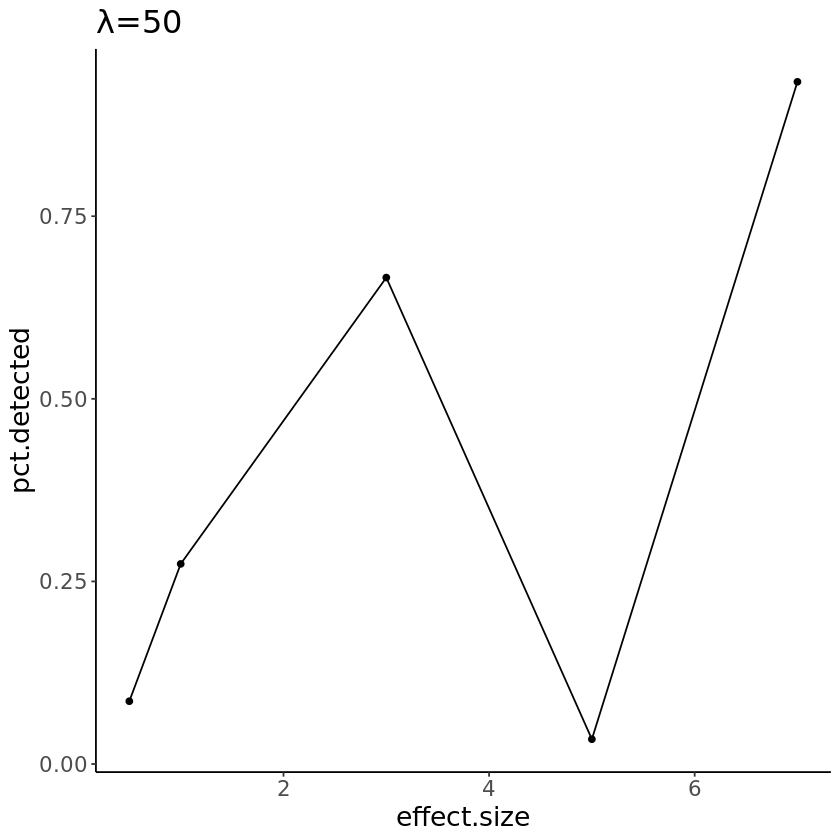

In [56]:
ggplot(power.plotdf, aes(x = effect.size, y = pct.detected)) + geom_point() + geom_line() +
theme_classic() + theme(text = element_text(size= 16)) + ggtitle(expression(paste(lambda, "=50")))

Calculate MSE

In [315]:
coeffs.compare.list[[2]]

term,estimate,true,gene
<chr>,<dbl>,"<dbl[,1]>",<int>
(Intercept),0.8011717,0.8368347,7278
tsA,-2.8235329,-2.9345785,7278
tsB,-3.0620537,-3.0489420,7278
s.score,1.5559742,1.5707699,7278
g2m.score,6.5126910,6.4769344,7278
percent.mito,3.4006056,3.0953799,7278
tsA:tsB,-0.3709179,7.0000000,7278
(Intercept),-0.5560971,-0.5129359,11496
tsA,-2.6569778,-2.8683460,11496


In [277]:
calculate_mse_mod <- function(data) {
    mod <- lm(true ~ estimate, data)
    return(mean(mod$residuals^2))
}

In [278]:
test.df <- coeffs.compare.list[[1]]
mse <- test.df %>% group_by(term) %>% 
            group_map(~calculate_mse_mod(.x)) %>% 
            setNames(unique(sort(test.df$term)))

In [279]:
mse

$`(Intercept)`
[1] 3.64599e-35

$g2m.score
[1] 1.998825e-29

$percent.mito
[1] 1.490555e-29

$s.score
[1] 3.614855e-30

$tsA
[1] 7.205727e-32

$`tsA:tsB`
[1] 1.923665e-29

$tsB
[1] 7.340617e-32

In [280]:
data.frame(mse)

X.Intercept.,g2m.score,percent.mito,s.score,tsA,tsA.tsB,tsB
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
3.64599e-35,1.998825e-29,1.490555e-29,3.614855e-30,7.205727e-32,1.923665e-29,7.340617e-32


In [281]:
mse.df.list <- list()

for (i in 1:length(effect.sizes.list)) {
    df <- coeffs.compare.list[[i]]
    mse <- df %>% group_by(term) %>% 
            group_map(~calculate_mse_mod(.x)) %>% 
            setNames(unique(sort(df$term)))
    mse.df <- data.frame(mse)
    mse.df <- mse.df %>% rename("tsA*tsB" = "tsA.tsB",
                                          "(Intercept)" = "X.Intercept.")
    mse.df.list[[i]] <- mse.df
}

In [282]:
mse.df.all <- do.call(rbind, mse.df.list)
mse.df.all$effect.sizes <- effect.sizes.list
mse.df.plotdf <- mse.df.all %>% tidyr::pivot_longer(!effect.sizes, names_to = "coeff", values_to = "MSE")

In [270]:
head(mse.df.plotdf)

effect.sizes,coeff,MSE
<dbl>,<chr>,<dbl>
0.5,(Intercept),3.645990e-35
0.5,g2m.score,1.998825e-29
0.5,percent.mito,1.490555e-29
0.5,s.score,3.614855e-30
0.5,tsA,7.205727e-32
0.5,tsA*tsB,1.923665e-29


In [271]:
mse.df.plotdf

effect.sizes,coeff,MSE
<dbl>,<chr>,<dbl>
0.5,(Intercept),3.645990e-35
0.5,g2m.score,1.998825e-29
0.5,percent.mito,1.490555e-29
0.5,s.score,3.614855e-30
0.5,tsA,7.205727e-32
0.5,tsA*tsB,1.923665e-29
0.5,tsB,7.340617e-32
1.0,(Intercept),3.645813e-35
1.0,g2m.score,1.996016e-29


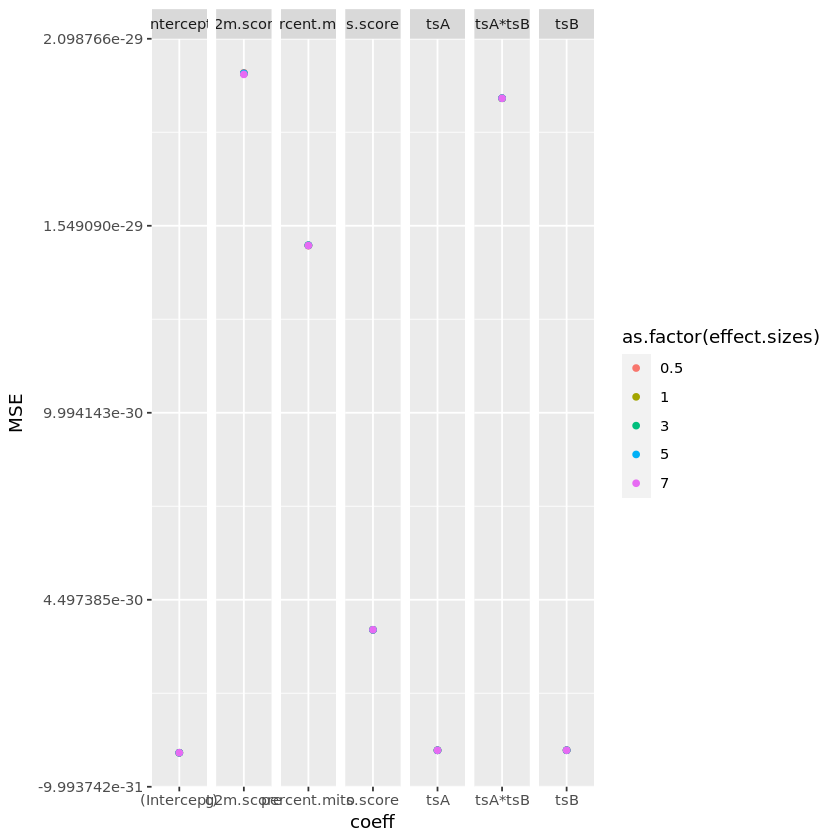

In [272]:
ggplot(mse.df.plotdf, aes(x = coeff, y = MSE, color = as.factor(effect.sizes))) + geom_point() + 
    facet_wrap(~coeff, ncol = 7, scales = "free_x")

In [292]:
lambda.list

[1]  15  50 100